# Libraries

In [2]:

from casadi import *
from casadi.tools import *
import numpy as np
import scipy.integrate as scp
import matplotlib.pyplot as plt
from scipy.integrate import odeint
import numpy.random as rnd
import torch
import copy
import torch.nn.functional as F
from scipy.optimize import minimize
from torch_pso import ParticleSwarmOptimizer
from scipy.signal import find_peaks
import gymnasium as gym
from gymnasium import spaces 
from stable_baselines3 import SAC, PPO

In [20]:
def sample_uniform_params(params_prev, param_max, param_min):
    params = {k: torch.rand(v.shape)* (param_max - param_min) + param_min \
              for k, v in params_prev.items()}
    return params

def sample_local_params(params_prev, param_max, param_min):
    params = {k: torch.rand(v.shape)* (param_max - param_min) + param_min + v \
              for k, v in params_prev.items()}
    return params

# Process Environment

### Gym Environment

In [13]:
# Create a gym environment
class RSR(gym.Env):
  def __init__(self,ns,test, plot = False):
    self.i = 0
    self.ns = ns 
    self.T  = 80
    self.Nx = 12
    self.plot = plot  
    self.test = test
    self.info = {'control_in':0,'PID_Action':0,'state':0}
    # Time Interval (min)
    self.t = np.linspace(0,self.T,self.ns)
    # Casadi Model
    self.sym_x = self.gen_casadi_variable(12, "x")
    self.sym_u = self.gen_casadi_variable(5, "u")    
    large_scale_ode = self.large_scale_ode
    self.casadi_sym_model = self.casadify(large_scale_ode, self.sym_x, self.sym_u)
    self.casadi_model_func = self.gen_casadi_function([self.sym_x, self.sym_u],[self.casadi_sym_model],
                                                    "model_func", ["x","u"], ["model_rhs"])
    # Observation Space
    self.observation_space = spaces.Box(low =np.array([10,10,10,20,20,20]) , high = np.array([30,30,30,21,21,21]), shape = (6,))
    # Action Space
    self.action_space = spaces.Box(low = 0, high = 1, shape = (16,))
    self.action_space_unnorm = spaces.Box(low = np.array([8,8,0.67,8]), high = np.array([47,47,3,45]))
    self.PID_space = spaces.Box(low = np.array([0.5,0.1,0.1,self.action_space_unnorm.low[0],0.5,0,0.1,self.action_space_unnorm.low[1],0.5,0.1,0.1,self.action_space_unnorm.low[2],0.5,0.1,0.1,self.action_space_unnorm.low[3]]),
                                 high = np.array([10,0.5,0.5,self.action_space_unnorm.low[0]+5,10,0.25,0.5,self.action_space_unnorm.low[1]+5,10,1,1,self.action_space_unnorm.low[2]+10,10,1,1,self.action_space_unnorm.low[3]+10] ),)
    self.SP = np.array([[21 for i in range(int(ns/2))] + [21 for i in range(int(ns/2))],[21 for i in range(int(ns/2))] + [21 for i in range(int(ns/2))],[21 for i in range(int(ns/2))] + [21 for i in range(int(ns/2))]])
    self.x0 = np.array([20, 0.8861, 0.1082, 0.0058, 20, 0.8861, 0.1082, 0.0058, 20, 0.1139, 0.7779, 0.1082,self.SP[0,0],self.SP[1,0],self.SP[2,0]])
    self.e_history = []

  def reset(self, seed = None):
    self.state = self.x0
    self.info['state'] = self.state[:self.Nx]
    self.i = 0
    self.done = False
    rl_state = [self.state[i] for i in [0, 4, 8,12,13,14]]
    self.norm_state = (rl_state- self.observation_space.low)/(self.observation_space.high - self.observation_space.low)
    return self.norm_state, {}
  def step(self, action):
    if self.i % 15 == 0:
      self.action = action * (self.PID_space.high - self.PID_space.low) + self.PID_space.low
    try:
      self.state[:self.Nx] = self.integrate(self.action)
    
    except:
      print('Integration Error')
      rew = -1e5
      self.done = True
    rew = self.reward(self.state[:self.Nx])
    self.info['PID_Action'] = self.action
    self.i += 1 
    
    if self. i == self.ns:
      self.done = True

    rl_state = [self.state[i] for i in [0, 4, 8,12,13,14]]
    self.norm_state = (rl_state- self.observation_space.low)/(self.observation_space.high - self.observation_space.low)
    return self.norm_state,rew,self.done,False,self.info

  
  def reward(self, state):
    
    state = [state[i] for i in [0, 4, 8]]
    error = np.sum((self.SP[:,self.i] - state)**2)
    return -error
     
  def integrate(self, PID_gains):
    
    state = self.state[:self.Nx]
    Holdups = [state[i] for i in [0, 4, 8]]
    self.e = self.SP[:,self.i] - np.array([Holdups])
    
    uk = np.zeros(5)

    uk[0] = self.PID_F_R(PID_gains[0:4])
    uk[1] = self.PID_F_M(PID_gains[4:8])
    uk[2] = self.PID_B(PID_gains[8:12])
    uk[3] = self.PID_D(PID_gains[12:16])
    if self.i <self.ns/2:
      uk[4] = 1.5
    else: 
      uk[4] = 1.5
    self.info['control_in'] = uk

    self.e_history.append(self.e[0]) 
    plant_func = self.casadi_model_func
    discretised_plant = self.discretise_model(plant_func,self.T/self.ns) 
  
    xk = self.state[:self.Nx]
    Fk = discretised_plant(x0=xk, p=uk)
    self.info['state'] = Fk['xf'].full().flatten()   
    return Fk['xf'].full().flatten()
  
  def PID_F_R(self, PID_gains):
    k_p = -1*PID_gains[0]
    k_i = -1*PID_gains[1]    
    k_d = -1*PID_gains[2]
    k_b = PID_gains[3] 
    e_history = np.array(self.e_history)
    e = self.e[0]
    if self.i == 0:
      e_history = np.zeros((1,3))
    
    u = k_p *e[0] + k_i *sum(e_history[:,0]) + k_d *(e[0]-e_history[-1,0])
  
    u += k_b
  
    u = np.clip(u, self.action_space_unnorm.low[0], self.action_space_unnorm.high[0])

    return u
  
  def PID_F_M(self, PID_gains):
    k_p = -1*PID_gains[0]
    k_i = -1*PID_gains[1]    
    k_d = -1*PID_gains[2]
    k_b = PID_gains[3] 
    e_history = np.array(self.e_history)
    e = self.e[0]
    
    if self.i == 0:
      e_history = np.zeros((1,3))
    u = k_p *e[1] + k_i *sum(e_history[:,1]) + k_d *(e[1]-e_history[-1,1])
    u += k_b
    u = np.clip(u, self.action_space_unnorm.low[1], self.action_space_unnorm.high[1])
  
    return u
     
  def PID_B(self, PID_gains):
    k_p = -1*PID_gains[0]
    k_i = -1*PID_gains[1]    
    k_d = -1*PID_gains[2]
    k_b = PID_gains[3] 
    e_history = np.array(self.e_history)
    e = self.e[0]
    if self.i == 0:
      e_history = np.zeros((1,3))
    u = k_p *e[2] + k_i *sum(e_history[:,2]) + k_d *(e[2]-e_history[-1,2])
    u += k_b
    u = np.clip(u, self.action_space_unnorm.low[2], self.action_space_unnorm.high[2])
    return u
    
  def PID_D(self, PID_gains):
    k_p = -1*PID_gains[0]
    k_i = -1*PID_gains[1]    
    k_d = -1*PID_gains[2]
    k_b = PID_gains[3] 
    e_history = np.array(self.e_history)
    e = self.e[0]
    if self.i == 0:
      e_history = np.zeros((1,3))
    u = k_p *e[2] + k_i *sum(e_history[:,2]) + k_d *(e[2]-e_history[-1,2])
    
    u += k_b
    u = np.clip(u, self.action_space_unnorm.low[3], self.action_space_unnorm.high[3])
    return u
  def casadify(self, model, sym_x, sym_u):
    """
    Given a model with Nx states and Nu inputs and returns rhs of ode,
    return casadi symbolic model (Not function!)
    
    Inputs:
        model - model to be casidified i.e. a list of ode rhs of size Nx
        
    Outputs:
        dxdt - casadi symbolic model of size Nx of rhs of ode
    """

    dxdt = model(sym_x, sym_u)
    dxdt = vertcat(*dxdt) #Return casadi list of size Nx

    return dxdt


  def gen_casadi_variable(self, n_dim, name = "x"):
        """
        Generates casadi symbolic variable given n_dim and name for variable
        
        Inputs:
            n_dim - symbolic variable dimension
            name - name for symbolic variable
            
        Outputs:
            var - symbolic version of variable
        """

        var = SX.sym(name, n_dim)

        return var

  def gen_casadi_function(self, casadi_input, casadi_output, name, input_name=[], output_name=[]):
        """
        Generates a casadi function which maps inputs (casadi symbolic inputs) to outputs (casadi symbolic outputs)
        
        Inputs:
            casadi_input - list of casadi symbolics constituting inputs
            casadi_output - list of casadi symbolic output of function
            name - name of function
            input_name - list of names for each input
            output_name - list of names for each output
        
        Outputs:
            casadi function mapping [inputs] -> [outputs]
        
        """

        function = Function(name, casadi_input, casadi_output, input_name, output_name)

        return function
    
  def discretise_model(self, casadi_func, delta_t):
        """
        Input:
            casadi_func to be discretised
        
        Output:
            discretised casadi func
        """
        x = SX.sym("x", 12)
        u = SX.sym("u", 5)
        xdot = casadi_func(x, u)
        dae = {'x':x, 'p':u, 'ode':xdot} 
        t0 = 0
        tf = delta_t
        discrete_model = integrator('discrete_model', 'cvodes', dae,t0,tf)

        return discrete_model
        

    
  def large_scale_ode(self,x, u):

      #Section 3.2 (Example 2) from https://www.sciencedirect.com/science/article/pii/S0098135404001784
      #This is a challenging control problem as the system can exhibit a severe snowball effect (Luyben, Tyr ́eus, & Luyben, 1999) if

      #Parameters
      rho = 1 #Liquid density
      alpha_1 = 90 #Volatility see: http://www.separationprocesses.com/Distillation/DT_Chp01-3.htm#:~:text=VLE%3A%20Relative%20Volatility&text=In%20order%20to%20separate%20a,is%20termed%20the%20relative%20volatility.
      k_1 = 0.0167 #Rate constant
      k_2 = 0.0167 #Rate constant
      A_R = 5 #Vessel area
      A_M = 10 #Vessel area
      A_B = 5 #Vessel area
      x1_O = 1.00

      ###Model Equations###

      ##States##
      #H_R - Liquid level of reactor
      #x1_R - Molar liquid fraction of component 1 in reactor
      #x2_R - Molar liquid fraction of component 2 in reactor
      #x3_R - Molar liquid fraction of component 3 in reactor
      #H_M - Liquid level of storage tank
      #x1_M - Molar liquid fraction of component 1 in storage tank
      #x2_M - Molar liquid fraction of component 2 in storage tank
      #x3_M - Molar liquid fraction of component 3 in storage tank
      #H_B - Liquid level of flash tank
      #x1_B - Molar liquid fraction of component 1 in bottoms
      #x2_B - Molar liquid fraction of component 2 in bottoms
      #x3_B - #Molar liquid fraction of component 3 in bottoms

      H_R, x1_R, x2_R, x3_R, H_M, x1_M, x2_M, x3_M, H_B, x1_B, x2_B, x3_B = x[0], x[1], x[2], x[3], x[4], x[5], x[6], x[7], x[8], x[9], x[10], x[11]

      ##Inputs##
      #F_O - Reactor input flowrate
      #F_R - Reactor outlet flowrate
      #F_M - Storage tank outlet flowrate
      #B - Bottoms flowrate
      #D - Distillate flowrate  
    
      F_R, F_M, B, D,F_O =  u[0], u[1], u[2], u[3],u[4]

      #Calculate distillate composition (only component 1 and 2 are volatile and component 3 is not
      #while component 1 is 90 times more volatile than component 2)

      x1_D = ((x1_B * alpha_1) / (1 - x1_B + x1_B * alpha_1))
      x2_D = 1 - x1_D

      dxdt = [
          (1/(rho*A_R)) * (F_O + D - F_R),
          ((F_O*(x1_O - x1_R) + D*(x1_D - x1_R))/(rho*A_R*H_R)) - k_1 * x1_R,
          ((-F_O * x2_R + D * (x2_D - x2_R))/(rho*A_R*H_R)) + k_1 * x1_R - k_2 * x2_R,
          ((-x3_R*(F_O + D))/(rho*A_R*H_R)) + k_2 * x2_R,
          (1/(rho*A_M)) * (F_R - F_M),
          ((F_R)/(rho*A_M*H_M))*(x1_R - x1_M),
          ((F_R)/(rho*A_M*H_M))*(x2_R - x2_M),
          ((F_R)/(rho*A_M*H_M))*(x3_R - x3_M),
          (1/(rho*A_B))*(F_M - B - D),
          (1/(rho*A_B*H_B))*(F_M*(x1_M-x1_B) - D*(x1_D - x1_B)),
          (1/(rho*A_B*H_B))*(F_M*(x2_M-x2_B) - D*(x2_D - x2_B)),
          (1/(rho*A_B*H_B))*(F_M*(x3_M-x3_B) + D*(x3_B))
          ]

      return dxdt


In [4]:
def rollout(ns,policy):
    env = RSR(ns,test=False,plot=False)
    s,_ = env.reset()
    done = False
    states = []
    actions = []
    rewards = []
    controls = []
    while not done:
        action = policy.predict(s)[0]
        state, reward, done, _,control = env.step(action)
        #un normalise state
        states.append(control['state'])
        actions.append(control['PID_Action'])
        rewards.append(reward)
        controls.append(control['control_in'])
    return states, actions, rewards,controls

In [25]:
def rollout_DFO(ns,policy):
    env = RSR(ns,test=False,plot=False)
    s,_ = env.reset()
    done = False
    states = []
    actions = []
    rewards = []
    controls = []
    while not done:
        action = (policy.predict(torch.tensor(s))[0] +1 )/2
       
        s, reward, done, _,control = env.step(action)
        #un normalise state
        states.append(control['state'])
      
        actions.append(control['PID_Action'])
        rewards.append(reward)
        controls.append(control['control_in'])
    
    return states, actions, rewards,controls

In [15]:
def plot_simulation(states,actions, control_inputs,ns):
    plt.rcParams['text.usetex'] = 'True'
    
    actions = np.array(actions)
    control_inputs = np.array(control_inputs)
    SP = np.array([[21 for i in range(int(ns/2))] + [21 for i in range(int(ns/2))]]).reshape(ns,1)
    SP_M = np.array([[21 for i in range(int(ns/2))] + [21 for i in range(int(ns/2))]]).reshape(ns,1)
    data = [np.array(states)[:,i] for i in [0,4,8,1,2,3,5,6,7,9,10,11]]
   
    titles = ['Level', 'Component Fractions', 'Actions', 'Control Inputs']
    control_labels = ['$F_R$', '$F_M$', '$B$', '$D$']
    labels = ['Reactor', 'Storage', 'Flash', '$x_{1,R}$', '$x_{2,R}$', '$x_{3,R}$', '$x_{1,M}$', '$x_{2,M}$', '$x_{3,M}$', '$x_{1,B}$', '$x_{2,B}$', '$x_{3,B}$']
    PID_labels = ['$k_p$', '$k_i$', '$k_d$', '$k_b$']
    colors_PID = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
    colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'tab:brown', 'tab:pink', 'tab:gray', 'tab:olive', 'tab:cyan', 'tab:blue', 'tab:orange']

    t = np.linspace(0, 20, ns)    
    fig, axs = plt.subplots(4, 2, figsize=(10, 12))
    for i in range(8):  # Loop over all 7 axes
        ax = axs[i//2, i%2]  # Get current axes
        ax.grid(True)  # Add grid
        ax.set_xlim(left=0, right=20)  # Set x-axis limits
        ax.set_xlabel('Time (h)')
    #Level Plots
    for i in range(3):
        axs[0,0].plot(t,data[i], color=colors[i], label=labels[i])
        axs[0,0].set_ylabel('Vessel Holdup')
    #axs[0,0].step(t, SP, 'k--', where  = 'post',label='SP$_R$ \& SP$_B$')
    axs[0,0].step(t, SP_M, 'k-.', where  = 'post',label='SP$_M$')
   
    axs[0,0].legend(loc='upper center', bbox_to_anchor=(0.5, 1.3),
          ncol=3,frameon=False)
    
    #Component Fraction Plots
    for i in range(3, len(data)):
        axs[0,1].plot(t,data[i], color=colors[i], label=labels[i])
    axs[0,1].set_ylabel('Liquid Component Fraction')
    axs[0,1].legend(loc='upper center', bbox_to_anchor=(0.5, 1.45),
          ncol=3,frameon=False)
    #PID Action Plots
    for i in range(0,4):
        axs[1,0].step(t, actions[:,i], where='post', linestyle='dashed', color=colors_PID[i % len(colors_PID)], label=PID_labels[i % len(PID_labels)])
    axs[1,0].set_ylabel('$F_R$ PID Action')
    axs[1,0].legend(loc='upper center', bbox_to_anchor=(0.5, 1.2),
          ncol=4,frameon=False)
    for i in range(4,8):
        axs[1,1].step(t, actions[:,i], where='post', linestyle='dashed', color=colors_PID[i % len(colors_PID)], label=PID_labels[i % len(PID_labels)])
    axs[1,1].set_ylabel('$F_M$ PID Action')
    axs[1,1].legend(loc='upper center', bbox_to_anchor=(0.5, 1.2),
          ncol=4,frameon=False)
    for i in range(8,12):
        axs[2,0].step(t, actions[:,i], where='post', linestyle='dashed', color=colors_PID[i % len(colors_PID)], label=PID_labels[i % len(PID_labels)])
    axs[2,0].set_ylabel('$B$ PID Action')
    axs[2,0].legend(loc='upper center', bbox_to_anchor=(0.5, 1.2),
          ncol=4,frameon=False)
    
    for i in range(12,16):
        axs[2,1].step(t, actions[:,i], where='post', linestyle='dashed', color=colors_PID[i % len(colors_PID)], label=PID_labels[i % len(PID_labels)])
    axs[2,1].set_ylabel('$D$ PID Action')
    axs[2,1].legend(loc='upper center', bbox_to_anchor=(0.5, 1.2),
          ncol=4,frameon=False)

    for i in range(2):
        axs[3,0].step(t, control_inputs[:,i], where='post', linestyle='dashed', color=colors[i % len(colors)], label=control_labels[i])
    axs[3,0].set_ylabel('Flowrate (h$^{-1}$)')
    axs[3,0].legend(loc='upper center', bbox_to_anchor=(0.5, 1.2),
          ncol=10,frameon=False)
   
 
    for i in range(2,4):
        axs[3,1].step(t, control_inputs[:,i], where='post', linestyle='dashed', color=colors[i % len(colors)], label=control_labels[i])
    axs[3,1].set_ylabel('Flowrate (h$^{-1}$)')
    axs[3,1].legend(loc='upper center', bbox_to_anchor=(0.5, 1.2),
          ncol=10,frameon=False)
    
    plt.subplots_adjust(hspace=0.5)
   
    plt.show()

In [19]:
def rollout_test(ns,Ks):
    env = RSR(ns,test=False,plot=False)
    s,_ = env.reset()
    done = False
    states = []
    actions = []
    rewards = []
    controls = []
    while not done:
        action = Ks
        state, reward, done, _,control = env.step(action)
        #un normalise state
        state = state * (env.observation_space.high - env.observation_space.low) + env.observation_space.low
        states.append(state[:env.Nx])
        actions.append(action)
        rewards.append(reward)
        controls.append(control['control_in'])
    return states, actions, rewards,controls

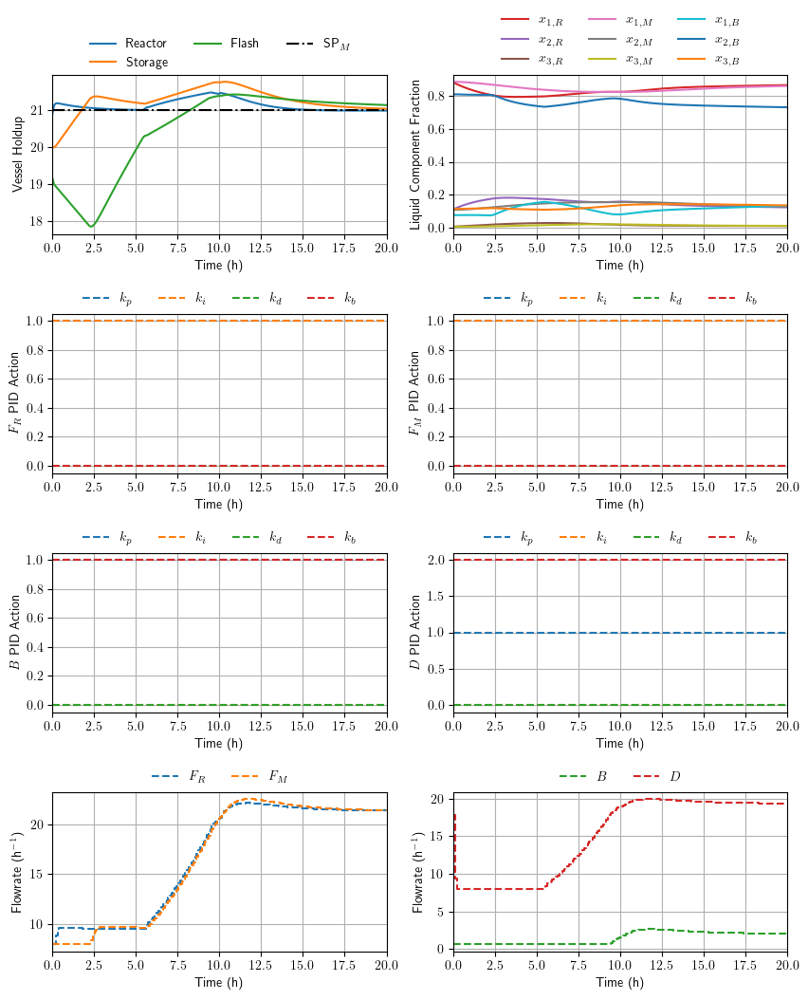

In [74]:
ns = 200
env = RSR(ns,test=False,plot=False)

Ks = np.array([1,1,0,0,1,1,0,0,1,0,0,1,1,0,0,2])
s,a,r,c = rollout_test(ns,Ks)
plot_simulation(s,a,c,ns)

## PG Policy

In [6]:
env = RSR(200,test = False,plot= False)

model = SAC('MlpPolicy', env, verbose = 1,learning_rate=0.00001)
model.learn(total_timesteps=1)

Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


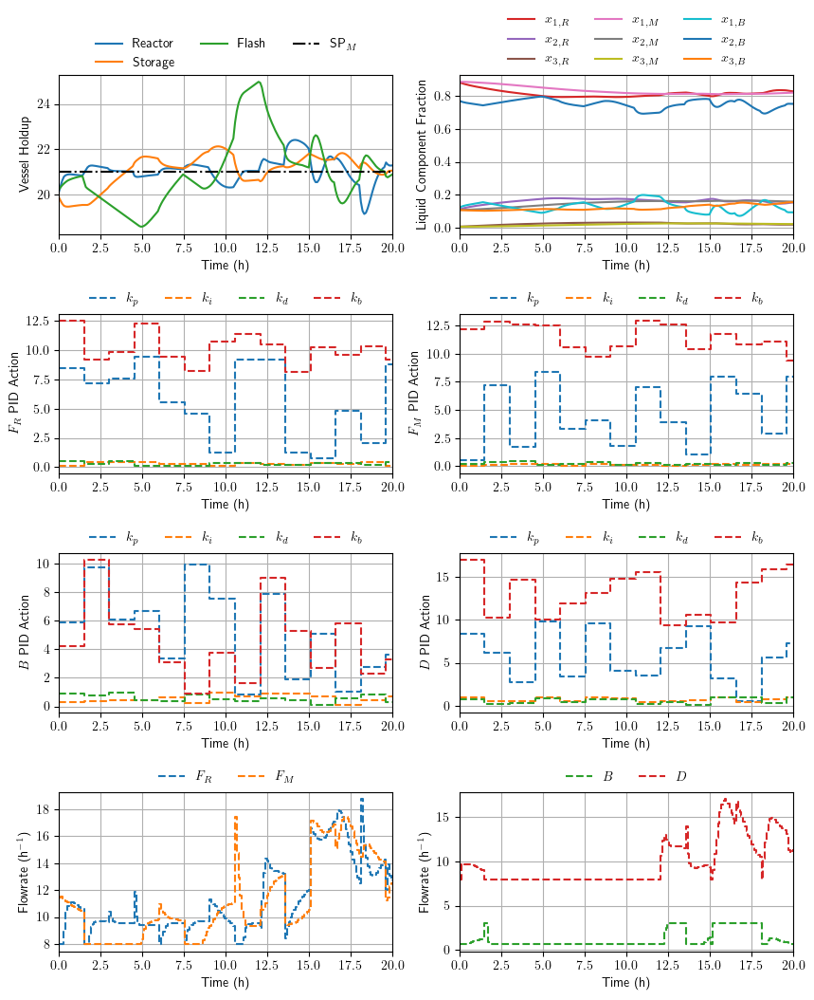

In [16]:
env = RSR(200,test = False,plot= False)
ns = 200
s, a,r,c = rollout(ns, model)

plot_simulation(s,a,c,ns)

## EA Policy

In [21]:
class Net(torch.nn.Module):

  def __init__(self, n_fc1, n_fc2, activation,n_layers,deterministic, **kwargs):
    super(Net, self).__init__()

    # Unpack the dictionary
    self.args     = kwargs
    self.dtype    = torch.float
    self.use_cuda = torch.cuda.is_available()
    self.device   = torch.device("cpu")
    self.deterministic = deterministic  
    self.input_size = 6 #State size: Ca, T, Ca setpoint and T setpoint
    self.output_sz  = 16 #Output size: Reactor Ks size
    self.n_layers = torch.nn.ModuleList()
    self.hs1        = n_fc1                                    # !! parameters
    self.hs2        = n_fc2                                      # !! parameter

    # defining layer
    self.hidden1 = torch.nn.Linear(self.input_size, self.hs1,bias=True)
    self.act = activation()
    self.hidden2 = torch.nn.Linear(self.hs1, self.hs2,bias=True)
    for i in range(0,n_layers):
      linear_layer = torch.nn.Linear(self.hs2,self.hs2)
      self.n_layers.append(linear_layer)
    self.output_mu = torch.nn.Linear(self.hs2, self.output_sz, bias=True)
    self.output_std = torch.nn.Linear(self.hs2, self.output_sz, bias=True)

  def predict(self, x):

    x = x.float()
    y           = self.act(self.hidden1(x))
    y           = self.act(self.hidden2(y))        
    mu = self.output_mu(y)
    log_std = self.output_std(y) 
    dist = torch.distributions.Normal(mu, log_std.exp()+ 1e-6)
    out = dist.sample()                                         
    y = F.tanh(out) #[-1,1]
    if self.deterministic:
      y = torch.tanh(mu)

    return y,_

In [18]:
def criterion(policy,ns):
  s,a,r,c = rollout_DFO(ns,policy)
  r = np.array(r)
  r_tot = -1*np.sum(r)
  
  global r_list
  global p_list
  global r_list_i
  r_list.append(r_tot)
  r_list_i.append(r_tot)
  p_list.append(policy)
  return r_tot

In [26]:
policy = Net(n_fc1 = 256,n_fc2 = 256,activation = torch.nn.ReLU,n_layers = 1,deterministic = False)

env = RSR(100,test = False,plot= False)
#Training Loop Parameters
k0     = 7.2e10 # Pre-exponential factor (1/sec)
UA     = 5e4    # U -Heat Transfer Coefficient (W/m^2-K) A -Area - (m^2)
old_swarm  = 1e8
new_swarm = 0
tol = 0.01
ns = 100


max_iter = 30

policy_list = np.zeros(max_iter)
reward_list = np.zeros(max_iter)
old_swarm = np.zeros(max_iter)
best_reward = 1e8
i = 0
r_list = []
r_list_i =[]
p_list  =[]

evals_rs = 30

params = policy.state_dict()
#Random Search
print('Random search to find good initial policy...')
for policy_i in range(evals_rs):
    # sample a random policy
    NNparams_RS  = sample_uniform_params(params, 0.1, -0.1)
    # consruct policy to be evaluated
    policy.load_state_dict(NNparams_RS)
    # evaluate policy
    r = criterion(policy,ns)
    #Store rewards and policies
    if r < best_reward:
        best_policy = p_list[r_list.index(r)]
        best_reward = r
        init_params= copy.deepcopy(NNparams_RS)
policy.load_state_dict(init_params)
#PSO Optimisation paramters
optim = ParticleSwarmOptimizer(policy.parameters(),
                               inertial_weight=0.5,
                               num_particles=15,
                               max_param_value=0.2,
                               min_param_value=-0.2)
print('Best reward after random search:', best_reward)
print('PSO Algorithm...')
while i < max_iter and abs(best_reward - old_swarm[i]) > tol :
    if i > 0:
      old_swarm[i] = min(r_list_i)
      del r_list_i[:]
    def closure():
        # Clear any grads from before the optimization step, since we will be changing the parameters
        optim.zero_grad()
        return criterion(policy,ns)
    optim.step(closure)
    new_swarm = min(r_list_i)

    if new_swarm < best_reward:
      best_reward = new_swarm
      best_policy = p_list[r_list.index(new_swarm)]
      
      print('New best reward:', best_reward,'iteration:',i+1,'/',max_iter)
    i += 1
print('Finished optimisation')
print('Best reward:', best_reward)
print('Plotting Best Policy...')



Random search to find good initial policy...
Best reward after random search: 106.99575251974926
PSO Algorithm...
New best reward: 95.5176535037141 iteration: 4 / 30
New best reward: 78.36483565104957 iteration: 6 / 30
New best reward: 66.28727980654894 iteration: 9 / 30
New best reward: 57.325765404851616 iteration: 15 / 30
Finished optimisation
Best reward: 57.325765404851616
Plotting Best Policy...


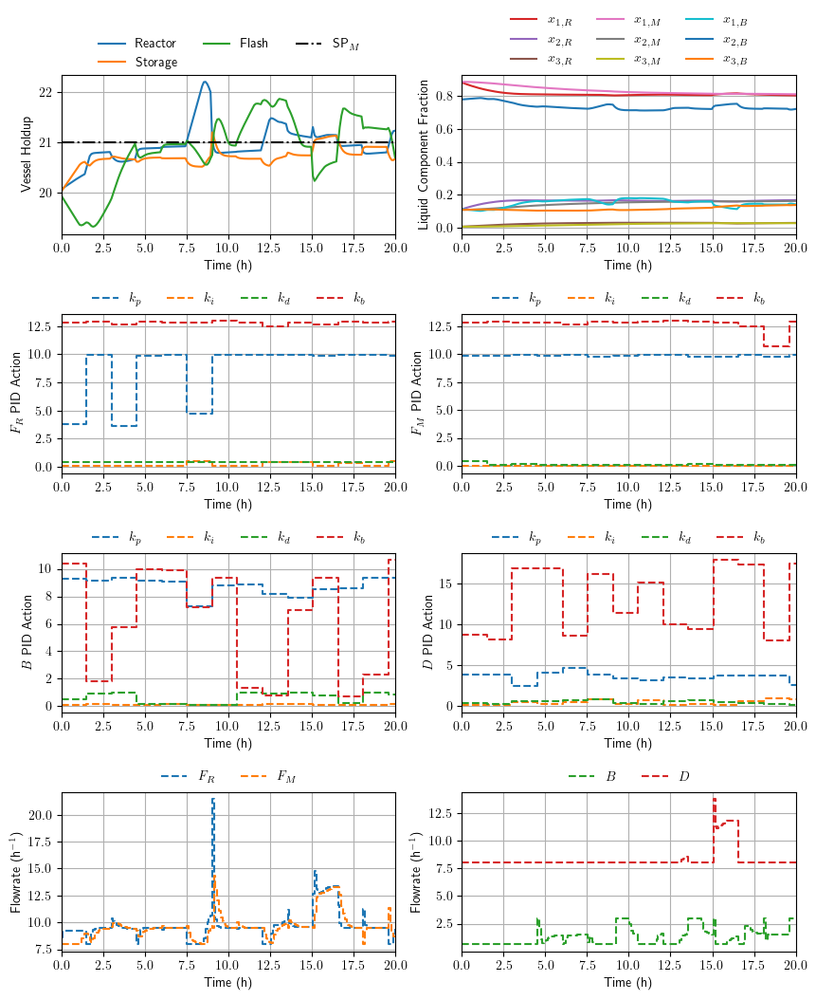

In [33]:
s,a,r,c = rollout_DFO(200,best_policy)
plot_simulation(s,a,c,200)

In [182]:
def dynamics(x,t,Tc,rr,Tf,k0,UA):

  '''
  Function takes the control input from RL algorithm, and previous states and returns
  the next state of the system

  States:
  x(0) - Reflux Drum Liquid Mole Fraction of Component A
  x(1-15) - Tray 1-15 - Liquid Mole Fraction of Component A
  x(16-29) - Tray 16-29 - Liquid Mole Fraction of Component A (Feed)
  x(30) - Tray 30 - Liquid Mole Fraction of Component Ah

  Control inputs:
  Tc - Temperature of reactor jacket
  rr - Reflux ratio

  Other inputs:
  Tf - Temperature of the feed (K). Used for disturbance rejection testing

  Outputs:
  xdot - next state of the system
  '''

  # == Reactor parameters == #

  Capf   = 1      # Process feed concentration of component A (mol/3)
  q      = 100    # Volumetric Flowrate (m^3/sec)
  V      = 100    # Volume of CSTR (m^3)
  rho    = 1000   # Density of A-B Mixture (kg/m^3)
  rho_M  = 0.01     # Molar density of A-B mix (mol/m3)
  Cp     = 0.239  # Heat capacity of A-B Mixture (J/kg-K)
  mdelH  = 5e4    # Heat of reaction for A->B (J/mol)
  EoverR = 8750   # E -Activation energy (J/mol), R -Constant = 8.31451 J/mol-K
  

  # == States == #
  Ca = x[32]
  T = x[33]
  R = x[34]
  CaR = x[35]
  CbR = x[36]


  # == Reactor Equations == #
  xdot = np.empty(len(x))
  qrf = R + q

  Caf = (R*CaR+q*Capf)/qrf
  rA     = k0*np.exp(-EoverR/T)*Ca # reaction rate
  xdot[32]  = q/V*(Caf - Ca) - rA     # Calculate concentration derivative
  xdot[33]   = q/V*(Tf - T) \
            + mdelH/(rho*Cp)*rA \
            + UA/V/rho/Cp*(Tc-T)   # Calculate temperature derivative


  Cb = (Caf*qrf-Ca*qrf)/qrf
  x_b = Cb*qrf/(Cb*qrf+Ca*qrf)
  x_feed = x_b
  qrf = qrf*rho_M

  # == Distillation Column Parameters == #
  # Vapor Mole Fractions of Component A
  # From the equilibrium assumption and mole balances
  # 1) vol = (yA/xA) / (yB/xB)
  # 2) xA + xB = 1
  # 3) yA + yB = 1

  D=0.5*qrf    # Distillate Flowrate (mol/s)
  B = qrf-D     # Bottoms flowrate (mol/s)
  L=rr*D        # Flowrate of the Liquid in the Rectification Section (mol/s)
  V=L+D         # Vapor Flowrate in the Column (mol/s)
  FL=qrf+L     # Flowrate of the Liquid in the Stripping Section (mol/s)
  vol=1.6         # Relative Volatility = (yA/xA)/(yB/xB) = KA/KB = alpha(A,B)
  atray=3       # Total Molar Holdup in the Condenser
  acond=1       # Total Molar Holdup on each Tray
  areb=0.5      # Total Molar Holdup in the Reboiler
  purge_ratio = 0.6 # Purge ratio

  # == Distillation Column equations == #
  y = np.empty(32)

  for i in range(32):
      y[i] = x[i] * vol/(1.0+(vol-1.0)*x[i])

  xdot[0] = 1/acond*V*(y[1]-x[0])
  for i in range(1,16):
      xdot[i] = 1.0/atray*(L*(x[i-1]-x[i])-V*(y[i]-y[i+1]))
  xdot[16] = 1/atray*(qrf*x_feed+L*x[15]-FL*x[16]-V*(y[16]-y[17]))
  for i in range(17,31):
      xdot[i] = 1.0/atray*(FL*(x[i-1]-x[i])-V*(y[i]-y[i+1]))
  xdot[31] = 1/areb*(FL*x[30]-(qrf-D)*x[31]-V*y[31])

  xdot[34] = (D - purge_ratio*D)*rho_M
  xdot[35] = (1-xdot[31])*B
  xdot[36] = (xdot[31])*B

  return  xdot

In [183]:
def PID(Ks, x, x_setpoint, e_history):

    # K gains
    KpCa = Ks[0]; KiCa = Ks[1]; KdCa = Ks[2]
    KpT  = Ks[3]; KiT  = Ks[4]; KdT  = Ks[5]; Kb = Ks[6]
    # setpoint error

    e = x_setpoint - x

    # control action

    u = KpT *e[1] + KiT *sum(e_history[:,1]) + KdT *(e[1]-e_history[-1,1])
    u  -= KpCa*e[0] + KiCa*sum(e_history[:,0]) + KdCa*(e[0]-e_history[-1,0])
    u += Kb
    u = min(max(u,200),400)


    return u

In [184]:
def PID_Dist(Ks, x, x_setpoint, e_history):

    # K gains
    Kp = Ks[0]; Ki = Ks[1]; Kd = Ks[2];  Kb = Ks[3]
    # setpoint error

    e = x_setpoint - x
    # if Ks[0] == 0 and Ks[1] == 0 and Ks[2] == 0:
    #   e = x - x_setpoint#

    # control action
    rr  = Kp*e + Ki*sum(e_history[:]) + Kd*(e-e_history[-1])
    rr += Kb

    rr = min(max(rr,0),10)


    return rr

In [337]:
def RSR_sim(Ks_opt,policy,ns,SP,time_step,disturb,minimise,full_output,k0,UA):
  # == data structures == #
  t  = np.linspace(0,time_step,ns)
  Ks_react_list = np.zeros((7,len(t)))
  Ks_dist_list = np.zeros((4,len(t)))
  e_history = []
  e_history_dist = []
  u = np.zeros((2,len(t)))
  x = np.zeros((37,len(t)))
  ie = np.zeros((len(t)))
  # == Normalisation ==#
  x_norm_react   = np.array([[.8, 315,0, 0],[.1, 10,.1, 20]])
  x_norm_dist = ([[0.96,0.95,0.96],[0.1,0.1,0.1]])

  # == Setpoints == #
  Ca_des = SP[0]
  T_des = SP[1]
  xd_des = SP[2]

  # == Initial states == #
  x_ss =np.array([0.935,0.900,0.862,0.821,0.779,0.738,\
  0.698,0.661,0.628,0.599,0.574,0.553,0.535,0.521,    \
  0.510,0.501,0.494,0.485,0.474,0.459,0.441,0.419,    \
  0.392,0.360,0.324,0.284,0.243,0.201,0.161,0.125,    \
  0.092,0.064])
  for i_s in range(31):
    x[i_s,0] = x_ss[i_s]
  x[32,0] = 0.87725294608097 # Reactor outlet concentration of Component A
  x[33,0] = 324.475443431599 # Temperature inside the CSTR
  x[34,0] = 0               # Recycle flowrate
  x[35,0] = 0              # Recycle concentration of A
  x[36,0] = 0              # Recycle concentration of B


  # == Initial Controls == #
  u[0,0] = 295 # Jacket temperature
  u[1,0] = 3   # Reflux ratio

  # == Simulation loop == #
  op_hi = 10
  op_lo = 0

  Tf = np.ones(len(t))*350 # Feed Temperature (K)

  if disturb:
      Tf[10:30] = 360
  for i in range(len(t)-1):
    #Time step
    ts      = [t[i],t[i+1]]
    #If using RL algorithm
    if minimise == False:
      #Construct state for RL policy
      xk_react = np.hstack((x[32,i],x[33,i],Ca_des[i],T_des[i]))
      if i > 0:
        xk_dist = np.hstack((x[0,i],xd_des[i],x[0,i-1]))
      else:
        xk_dist = np.hstack((x[0,i],xd_des[i],x[0,i-1]))

      #Normalise State
      xk_norm_react = ((xk_react-x_norm_react[0])/x_norm_react[1])
      xk_norm_dist = ((xk_dist-x_norm_dist[0])/x_norm_dist[1])
      state_react = torch.tensor(xk_norm_react)
      state_dist = torch.tensor(xk_norm_dist)

      #Get PID Ks from RL policy
      Ks_react = np.abs(policy(state_react).detach().numpy())
      Ks_dist = np.abs(policy(state_dist).detach().numpy())
      for ks_i in range(0,3):
          Ks_react[ks_i] = (Ks_react[ks_i])*10/6
          Ks_react_list[ks_i,i] = Ks_react[ks_i]
      for ks_i in range(3,6):
          Ks_react[ks_i] = (Ks_react[ks_i])*0.5/6
          Ks_react_list[ks_i,i] = Ks_react[ks_i]
      Ks_react[6] = 360
      Ks_react_list[6,i] = Ks_react[6]
        

    if minimise:
      Ks_react = Ks_opt[:7]
      Kc = Ks_opt[7]
      tauI = Ks_opt[8]
      tauD = Ks_opt[9]
      kb = Ks_opt[10]
    # Reactor Control
    SP_react = np.hstack((Ca_des[i],T_des[i]))
    react_state = np.hstack((x[32,i],x[33,i]))
    if i == 0:
        u[0,i]  = PID(Ks_react, react_state, SP_react, np.array([[0,0]]))
    else:
        u[0,i]  = PID(Ks_react,react_state, SP_react, np.array(e_history))

    #Distillation Column Control
    if minimise == False:
      Kc = Ks_dist[0]*500/6  
      tauI = Ks_dist[1]*20/6 
      tauD = Ks_dist[2]*1200/6  
      kb = 8
      Ks_dist_list[0,i] = Kc
      Ks_dist_list[1,i] = tauI
      Ks_dist_list[2,i] = tauD
      Ks_dist_list[3,i] = kb
    Ks_dist = np.array([Kc,tauI,tauD,kb])

    if i == 0:
        u[1,i]  = PID_Dist(Ks_dist, x[0,i], xd_des[i], np.array([0]))
    else:
        u[1,i]  = PID_Dist(Ks_dist,x[0,i], xd_des[i], np.array(e_history_dist))



    #Integrate dynamics
    Tj = u[0,i]
    rr = u[1,i]


    y = odeint(dynamics,x[:,i],ts,args=(Tj,rr,Tf[i],k0,UA))



    #Assign the t+1 state
    x[:,i+1] = y[-1]

    #Add noise
    x[0,i+1] = x[0,i+1] + np.random.uniform(low=-0.005,high=0.005)
    x[32,i+1] = x[32,i+1] + np.random.uniform(low=-0.001,high=0.001)
    x[33,i+1] = x[33,i+1] + np.random.uniform(low=-.5,high=0.5)

    react_state = np.hstack((x[32,i+1],x[33,i+1]))
    SP_react = np.hstack((Ca_des[i+1],T_des[i+1]))
    e_history.append((SP_react-react_state))
    e_history_dist.append((xd_des[i+1] - x[0,i+1]))

  xd = x[0,:]

  #Caculate reward
  #Penalise control action magnitude
  u_mag = np.abs(u[1,:])/10
  u_mag = np.sum(u[1,:]/10)
  # penalise change in control action
  u_cha = np.abs(u[1,:][1:]-u[1,:][0:-1])/10
  u_cha = np.sum(u_cha/10)

  r_x = sum((xd_des-xd)**2)*100+u_mag+u_cha
  #Return simulation data
  data = {}
  data['states'] = x
  data['T'] = x[33,:]
  data['Ca'] = x[32,:]
  data['Tc'] = u[0,:]
  data['rr'] = u[1,:]
  data['xd'] = xd
  data['control'] = u
  data['ks_react'] = Ks_react_list
  data['ks_dist'] =  Ks_dist_list
  data['r_x'] = r_x
  if full_output:
    return data
  else:
    return r_x

In [186]:
def plot_simulation_dist(Ca_dat, T_dat, xd_dat,rr_dat,SP_react,SP_dist,Tc_dat,ks_react,ks_dist):


    t = np.linspace(0,25,np.shape(xd_dat)[0])
    plt.figure(figsize=(15, 30))

    plt.subplot(9,1,1)
    plt.plot(t, np.median(Ca_dat,axis=1), 'r-', lw=3)
    plt.gca().fill_between(t, np.min(Ca_dat,axis=1), np.max(Ca_dat,axis=1),
                           color='r', alpha=0.2)
    plt.step(t, SP_react[0], '--', lw=1.5, color='black')
    plt.ylabel('Ca (mol/m^3)')
    plt.xlabel('Time (min)')
    plt.legend(['Concentration of A in CSTR'],loc='best')
    plt.xlim(min(t), max(t))

    plt.subplot(9,1,2)
    plt.plot(t, np.median(T_dat,axis=1), 'c-', lw=3)
    plt.gca().fill_between(t, np.min(T_dat,axis=1), np.max(T_dat,axis=1),
                           color='c', alpha=0.2)
    plt.step(t, SP_react[1], '--', lw=1.5, color='black')
    plt.ylabel('T (K)')
    plt.xlabel('Time (min)')
    plt.legend(['Reactor Temperature'],loc='best')
    plt.xlim(min(t), max(t))


    plt.subplot(9,1,3)
    plt.step(t, np.median(Tc_dat,axis=1), 'b--', lw=3)
    plt.ylabel('Cooling T (K)')
    plt.xlabel('Time (min)')
    plt.legend(['Jacket Temperature'],loc='best')
    plt.xlim(min(t), max(t))


    plt.subplot(9,1,4)
    plt.plot(t, np.median(xd_dat,axis=1), 'c-', lw=1.5)
    plt.gca().fill_between(t, np.min(xd_dat,axis=1), np.max(xd_dat,axis=1),
                           color='c', alpha=0.2)
    plt.step(t, SP_dist[0], '--', lw=1.5, color='black')
    plt.ylabel('xd ')
    plt.xlabel('Time (min)')
    plt.legend(['Distillate Mole Fraction'],loc='best')
    plt.xlim(0, 25)

    plt.subplot(9,1,5)
    plt.step(t, np.median(rr_dat,axis=1), 'b', lw=3)
    plt.ylabel('Reflux Ratio')
    plt.xlabel('Time (min)')
    plt.legend(['Reflux Ratio'],loc='best')
    plt.xlim(0, 25)



    labels = ['Cakp','Caki','Cakd','Tkp','Tki','Tkd']
    col = ['c-','r-','b-','c-','r-','b-']
    plt.subplot(9,1,6)
    for ks_i in range(3):
      plt.plot(t, np.median(ks_react[ks_i,:,:],axis=1), col[ks_i], lw=3,label = labels[ks_i])
      plt.gca().fill_between(t, np.min(ks_react[ks_i,:,:],axis=1), np.max(ks_react[ks_i,:,:],axis=1),
                              color='c', alpha=0.2)
    plt.ylabel('Ca PID Parameter')
    plt.xlabel('Time (min)')
    plt.legend(loc='best')
    plt.xlim(min(t), max(t))

    plt.subplot(9,1,7)
    i = [3,4,5]
    for ks_i in i:
      plt.plot(t, np.median(ks_react[ks_i,:,:],axis=1), col[ks_i], lw=3,label = labels[ks_i])
      plt.gca().fill_between(t, np.min(ks_react[ks_i,:,:],axis=1), np.max(ks_react[ks_i,:,:],axis=1),
                              color='c', alpha=0.2)
    plt.ylabel('T PID Parameter')
    plt.xlabel('Time (min)')
    plt.legend(loc='best')
    plt.xlim(min(t), max(t))

    plt.subplot(9,1,8)
    plt.plot(t, np.median(ks_react[6,:,:],axis=1), 'c-', lw=3,label = 'Baseline Ks')
    plt.gca().fill_between(t, np.min(ks_react[6,:,:],axis=1), np.max(ks_react[6,:,:],axis=1),
                              color='c', alpha=0.2)
    plt.ylabel('Baseline PID Parameter')
    plt.xlabel('Time (min)')
    plt.legend(loc='best')
    plt.xlim(min(t), max(t))

    label_dist = ['xdkp','xdki','xdkd']
    col_dist = ['c-','r-','b-']
    plt.subplot(9,1,9)
    for ks_i in range(3):
      plt.plot(t, np.median(ks_dist[ks_i,:,:],axis=1), col_dist[ks_i], lw=3,label = label_dist[ks_i])
      plt.gca().fill_between(t, np.min(ks_dist[ks_i,:,:],axis=1), np.max(ks_dist[ks_i,:,:],axis=1),
                              color='c', alpha=0.2)
    plt.ylabel('xd PID Parameter')
    plt.xlabel('Time (min)')
    plt.legend(loc='best')
    plt.xlim(min(t), max(t))


    plt.tight_layout()
    plt.show()

# RL-PID

In [187]:
class Net(torch.nn.Module):

  def __init__(self,n_fc1R,n_fc2R,n_fc1D,n_fc2D,activationR,activationD,n_layersR,n_layersD,**kwargs):
    super(Net, self).__init__()

    # Unpack the dictionary
    self.args     = kwargs
    self.dtype    = torch.float
    self.use_cuda = torch.cuda.is_available()
    self.device   = torch.device("cpu")

    self.input_size_react = 4 #State size: Ca, T, Ca setpoint and T setpoint
    self.output_sz_react  = 7 #Output size: Reactor Ks size
    self.input_size_dist = 3 #State size: xd, xf,sp
    self.output_sz_dist = 4 #Output size: Distillation Ks size
    self.n_layersR = torch.nn.ModuleList()
    self.n_layersD = torch.nn.ModuleList()
    self.hs1_react       = n_fc1R                                     # !! parameters
    self.hs2_react        = n_fc2R                                  # !! parameter
    self.hs1_dist        = n_fc1D                                    # !! parameters
    self.hs2_dist      = n_fc2D                            # !! parameter

    # defining layer
    #Reactor
    self.hidden1_react = torch.nn.Linear(self.input_size_react, self.hs1_react )
    self.hidden2_react = torch.nn.Linear(self.hs1_react, self.hs2_react)
    self.output_react = torch.nn.Linear(self.hs2_react, self.output_sz_react)
    self.actR = activationR()
    for i in range(0,n_layersR):
      linear_layerR = torch.nn.Linear(self.hs2_react,self.hs2_react)
      self.n_layersR.append(linear_layerR)
    #Distillation
    self.hidden1_dist = torch.nn.Linear(self.input_size_dist, self.hs1_dist )
    self.hidden2_dist = torch.nn.Linear(self.hs1_dist, self.hs2_dist)
    self.output_dist = torch.nn.Linear(self.hs2_dist, self.output_sz_dist)
    self.actD = activationD()
    for i in range(0,n_layersD):
      linear_layerD = torch.nn.Linear(self.hs2_dist,self.hs2_dist)
      self.n_layersD.append(linear_layerD)

    #self.af     = torch.nn.Tanh()

  def forward(self, x):
    x = x.float()

    if x.size(dim = 0) > 3:
        y           = self.actR(self.hidden1_react(x))
        y           = self.actR(self.hidden2_react(y))
        for i,layer in enumerate(self.n_layersR):
          y = self.actR(layer(y))
        y           = F.relu6(self.output_react(y))
    else:                                                 # range (0,6)
        y           = self.actD(self.hidden1_dist(x))
        y           = self.actD(self.hidden2_dist(y))
        for i,layer in enumerate(self.n_layersD):
          y = self.actD(layer(y))
        y           = F.relu6(self.output_dist(y))
    #print(y)
    return y

In [188]:
def criterion_cs3_valid(policy,SP,ns,k0,UA):
    #Process Simulation

    r_SPi = np.zeros(5)
    for SPi in range(5):
      if SPi == 5:
        data_RSR = RSR_sim(1,policy, ns,SP[SPi],200,True,False,True,k0,UA)
      else:
        data_RSR = RSR_sim(1,policy,ns,SP[SPi],200,False,False,True,k0,UA)
      r_SPi[SPi] =  data_RSR['r_x']
    #Store rewards and policies
    r_tot = sum(r_SPi)

    global r_list
    global p_list
    global r_list_i
    r_list.append(r_tot)
    r_list_i.append(r_tot)
    p_list.append(policy)

    return r_tot

In [303]:
policy = Net(20,5,20,20,torch.nn.Sigmoid,torch.nn.Sigmoid,1,1)

#Training Loop Parameters
params = policy.state_dict()
evals_rs = 10
best_reward = 1e8
r_list = []
p_list = []
r_list_i = []
old_swarm  = 1e8
new_swarm = 0
tol = 1
ns = 200

k0     = 7.2e10 # Pre-exponential factor (1/sec)
UA     = 7e5    # U -Heat Transfer Coefficient (W/m^2-K) A -Area - (m^2)

Ca_des = [0.1 for i in range(ns)]
T_des  = [370 for i in range(ns)]

xd_des1 = np.ones(ns)*0.90
xd_des1[int(ns/2):] = 0.97

xd_des2 = np.ones(ns)*0.97
xd_des2[int(ns/2):] =0.90

xd_des3 = np.ones(ns)*0.97
xd_des3[int(ns/2):] = 0.935

xd_des4 = np.ones(ns)*0.90
xd_des4[int(ns/2):] = 0.97

xd_disturb = np.ones(ns)*0.935
SP = np.array(([Ca_des,T_des,xd_des1],[Ca_des,T_des,xd_des2],[Ca_des,T_des,xd_des3],[Ca_des,T_des,xd_des4],[Ca_des,T_des,xd_disturb]))


#Random Search to find good initial policy
print('Random search to find good initial policy...')
for policy_i in range(evals_rs):
    # sample a random policy
    NNparams_RS  = sample_uniform_params(params, 5, -5)

    # consrict policy to be evaluated
    policy.load_state_dict(NNparams_RS)
    # evaluate policy


    r = criterion_cs3_valid(policy,SP,ns,k0,UA)
    #Store rewards and policies


    #print(policy_i)
    if r < best_reward:
        best_policy = p_list[r_list.index(r)]
        best_reward = r
        init_params= copy.deepcopy(NNparams_RS)

#PSO Optimisation paramters

policy.load_state_dict(init_params)

optim = ParticleSwarmOptimizer(policy.parameters(),
                               inertial_weight=0.1,
                               num_particles=30,
                               max_param_value=5,
                               min_param_value=-5)




max_iter = 20
policy_list = np.zeros(max_iter)
reward_list = np.zeros(max_iter)
old_swarm = np.zeros(max_iter+1)

i = 0



old_swarm[0] = 1e8

#PSO Training Loop
print('PSO algorithm...')
while abs(best_reward - old_swarm[i]) > tol and i < max_iter:

    if i > 0:
      old_swarm[i] = min(r_list_i)
      del r_list_i[:]
    def closure():
        # Clear any grads from before the optimization step, since we will be changing the parameters
        optim.zero_grad()
        return criterion_cs3_valid(policy,SP,ns,k0,UA)
    optim.step(closure)
    new_swarm = min(r_list)



    if new_swarm < best_reward:
      best_reward = new_swarm
      best_policy = p_list[r_list.index(new_swarm)]
      print('New best reward:', best_reward)
    i += 1




Random search to find good initial policy...
PSO algorithm...
New best reward: 242.5751108564321
New best reward: 236.99155587658106
New best reward: 234.98895282449854
New best reward: 233.5312141184664


# Save the model

In [190]:
torch.save(best_policy.state_dict(),'CS3.pth')
policy.load_state_dict(torch.load('CS3.pth'))

<All keys matched successfully>

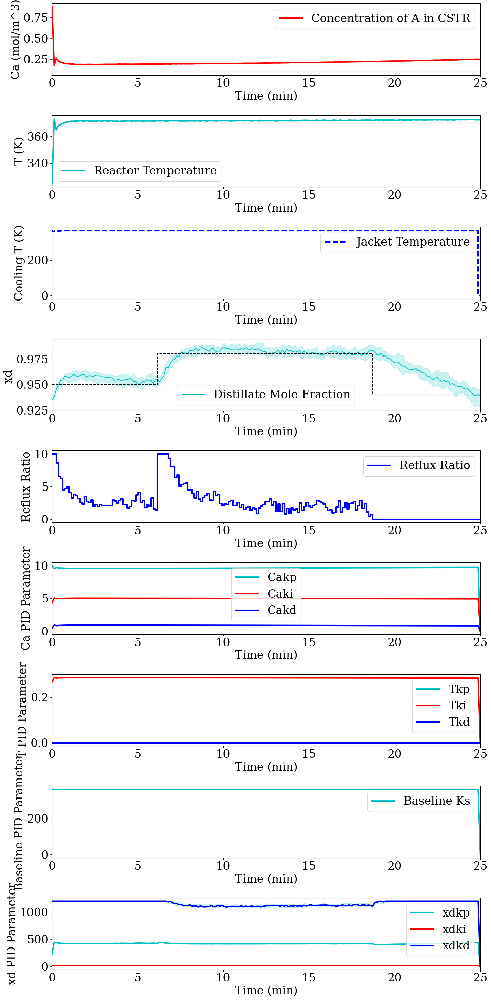

ISE:  0.032486435521332714


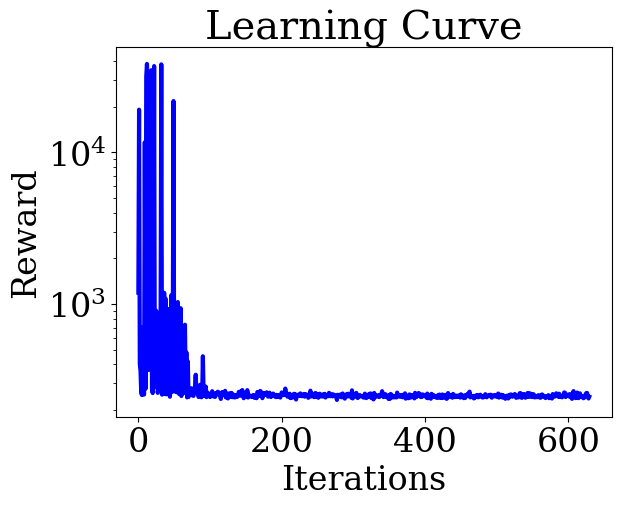

In [344]:
#Validation and plotting
reps = 10
ns = 200
k0     = 7.2e10 # Pre-exponential factor (1/sec)
UA     = 7e5    # U -Heat Transfer Coefficient (W/m^2-K) A -Area - (m^2)
Ca_eval = np.zeros((ns, reps))
T_eval = np.zeros((ns, reps))
Tc_eval = np.zeros((ns, reps))
xd_eval = np.zeros((ns, reps))
rr_eval = np.zeros((ns, reps))
ks_react_RL = np.zeros((7,ns,reps))
ks_dist_RL = np.zeros((4,ns,reps))

Ca_des_test = [0.1 for i in range(ns)]
T_des_test  = [370 for i in range(ns)]
xd_des_test = np.ones(ns)*0.95
xd_des_test[int(ns/4):] = 0.98
xd_des_test[int(3*ns/4):] = 0.94


SP_test = np.array([Ca_des_test,T_des_test,xd_des_test])

for r_i in range(reps):
    data = RSR_sim(1,best_policy,ns,SP_test,200,True,False,True,k0,UA)

    Ca_eval[:,r_i] = data['Ca']
    T_eval[:,r_i] = data['T']
    xd_eval[:,r_i] = data['xd']
    rr_eval[:,r_i] = data['rr']
    Tc_eval[:,r_i] = data['Tc']
    ks_react_RL[:,:,r_i] = data['ks_react']
    ks_dist_RL[:,:,r_i] = data['ks_dist']

SP_dist = np.array(([xd_des_test]))
SP_react = np.array([Ca_des_test,T_des_test])
# Plot sim results
plot_simulation_dist(Ca_eval, T_eval, xd_eval,rr_eval,SP_react,SP_dist,Tc_eval,ks_react_RL,ks_dist_RL)

# Plot training performance
plt.plot(list(r_list),'b',lw = 3)
plt.ylabel('Reward')
plt.yscale('log')
plt.xlabel('Iterations')
plt.title('Learning Curve')
print('ISE: ', sum((np.median(xd_eval,axis = 1)-xd_des_test)**2))

In [406]:
learning_curve = np.array(r_list)
np.save('learning_curve_CS3.npy',learning_curve)

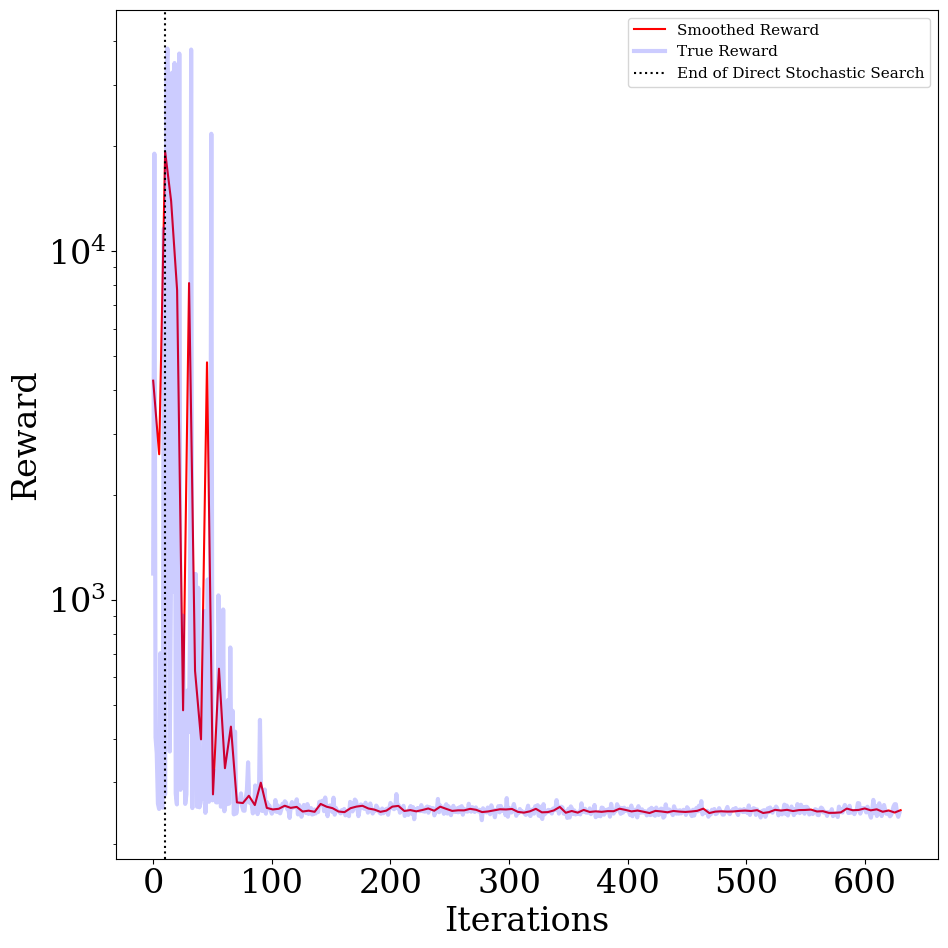

In [306]:
# Plot training performance

def average_5(lst):
    averages = []
    avg_every = 5
    for i in range(0, len(lst), avg_every):
        chunk = lst[i:i+avg_every]
        if len(chunk) == avg_every:
            avg = sum(chunk) / avg_every
            averages.append(avg)
    return averages

r_avg = average_5(r_list)
x = np.linspace(0,len(r_list),len(r_avg))
plt.figure(figsize=(10,10))
plt.plot(x,r_avg,'r', label = 'Smoothed Reward')
plt.plot(list(r_list),'b',lw = 3,alpha = 0.2, label =  'True Reward')
plt.axvline(x=evals_rs, linestyle = 'dotted', color = 'black',label = 'End of Direct Stochastic Search')
plt.yscale('log')
plt.ylabel('Reward')
plt.xlabel('Iterations')
plt.legend(prop={'size':11})
plt.savefig('Learning_Curve_CS3.pdf')
plt.tight_layout()
plt.show()

# DFO-PID

In [193]:
def Random_search(f, n_p, bounds_rs, iter_rs,SP,ns,k0,UA):
    '''
    This function is a naive optimization routine that randomly samples the
    allowed space and returns the best value.

    This is used to find a good starting point for Powell
    '''


    # arrays to store sampled points
    localx   = np.zeros((n_p,iter_rs))  # points sampled
    localval = np.zeros((iter_rs))        # function values sampled
    # bounds
    bounds_range = bounds_rs[:,1] - bounds_rs[:,0]
    bounds_bias  = bounds_rs[:,0]

    for sample_i in range(iter_rs):
        x_trial = np.random.uniform(0, 1, n_p)*bounds_range + bounds_bias # sampling
        localx[:,sample_i] = x_trial
        localval[sample_i] = f(x_trial,1,ns,SP,200,True,True,False,k0,UA) # f
    # choosing the best
    minindex = np.argmin(localval)
    f_b      = localval[minindex]
    x_b      = localx[:,minindex]

    return f_b,x_b

#########################
# --- Powell Method --- #
#########################

# (f, N_x: int, bounds: array[array[float]], N: int = 100) -> array(N_X), float
def opt_Powell(f, x_dim, bounds, iter_tot,SP,ns,k0,UA):
    '''
    params: parameters that define the rbf model
    X:      matrix of previous datapoints
    '''

    n_rs = int(min(100,max(iter_tot*.05,5)))       # iterations to find good starting point

    # evaluate first point
    f_best, x_best = Random_search(f, x_dim, bounds, n_rs,SP,ns,k0,UA)
    iter_          = iter_tot - n_rs

    opt = minimize(f, x_best,args = (1,ns,SP,200,True,True,False,k0,UA), bounds=bounds, method='Powell',
                   options={'maxfev': iter_})
    print('PID tuning results')
    print(opt)

    return opt.x, opt.fun

In [283]:
#Optimise PID parameters over whole time period for Case-Study 3
#Optimiser Parameters

ns = 200
Ca_des_test = [0.1 for i in range(ns)]
T_des_test  = [370 for i in range(ns)]
xd_des_test = np.ones(ns)*0.95
xd_des_test[int(ns/4):] = 0.98
xd_des_test[int(3*ns/4):] = 0.94


SP = np.array([Ca_des_test,T_des_test,xd_des_test])

k0     = 7.2e10 # Pre-exponential factor (1/sec)
UA     = 7e5    # U -Heat Transfer Coefficient (W/m^2-K) A -Area - (m^2)

iter_tot = 2000
boundsKs = np.array([[0,15]]*3+[[0,0.5]]*3+[[280,300]]+[[0,1200]]*3+[[0,10]])

#Call optimiser
Ks_opt, f_opt = opt_Powell(RSR_sim, 11, boundsKs, iter_tot, SP,ns,k0,UA)

#Simulate and Plot Results
reps = 10
xd_ks_evals = np.zeros((ns,reps))
rr_ks_evals = np.zeros((ns,reps))
T_ks_evals = np.zeros((ns,reps))
Ca_ks_evals = np.zeros((ns,reps))
Tc_ks_evals = np.zeros((ns,reps))
ks_ks_react = np.tile(Ks_opt[:7],(reps,ns,7)).T
ks_ks_dist = np.tile(Ks_opt[7:],(reps,ns,3)).T

for r_i in range(reps):
  data_KsOpt = RSR_sim(Ks_opt,1,ns,SP,200,True,True,True,k0,UA)
  xd_ks_evals[:,r_i] = data_KsOpt['xd']
  rr_ks_evals[:,r_i] = data_KsOpt['rr']
  T_ks_evals[:,r_i] = data_KsOpt['T']
  Ca_ks_evals[:,r_i] = data_KsOpt['Ca']
  Tc_ks_evals[:,r_i] = data_KsOpt['Tc']


PID tuning results
 message: Optimization terminated successfully.
 success: True
  status: 0
     fun: 49.377367634686905
       x: [ 5.729e+00  5.749e+00  9.271e+00  3.215e-01  3.849e-01
            2.083e-01  2.924e+02  1.751e+02  5.568e+02  4.584e+02
            7.984e+00]
     nit: 4
   direc: [[ 1.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]]
    nfev: 1026


In [341]:
ns = 200
Ca_des_test = [0.1 for i in range(ns)]
T_des_test  = [370 for i in range(ns)]
xd_des_test = np.ones(ns)*0.95
xd_des_test[int(ns/4):] = 0.98
xd_des_test[int(3*ns/4):] = 0.94


SP = np.array([Ca_des_test,T_des_test,xd_des_test])

reps = 10
xd_ks_evals = np.zeros((ns,reps))
rr_ks_evals = np.zeros((ns,reps))
T_ks_evals = np.zeros((ns,reps))
Ca_ks_evals = np.zeros((ns,reps))
Tc_ks_evals = np.zeros((ns,reps))
ks_ks_react = np.tile(Ks_opt[:7],(reps,ns,7)).T
ks_ks_dist = np.tile(Ks_opt[7:],(reps,ns,3)).T

for r_i in range(reps):
  data_KsOpt = RSR_sim(Ks_opt,1,ns,SP,200,True,True,True,k0,UA)
  xd_ks_evals[:,r_i] = data_KsOpt['xd']
  rr_ks_evals[:,r_i] = data_KsOpt['rr']
  T_ks_evals[:,r_i] = data_KsOpt['T']
  Ca_ks_evals[:,r_i] = data_KsOpt['Ca']
  Tc_ks_evals[:,r_i] = data_KsOpt['Tc']
print('ISE: ', sum((np.median(xd_ks_evals,axis = 1)-xd_des_test)**2))

ISE:  0.04363620753702144


# Relay-PID

In [195]:
def OnOffController_Tj(e):
  if e < 0:
    Tj = 400
  else:
    Tj = 295
  return Tj

In [196]:
def OnOffController_rr(e):
  if e < 0:
    rr = 10
  else:
    rr = 0
  return rr

In [279]:
def relay_tune_CS3(T_controller,ca_controller,dist_controller,Ks,loop,model):
  '''
  Determine PID parameters via the relay tuning method developed by Astrom and Haggland (1984)

  '''
  k0     = 7.2e10 # Pre-exponential factor (1/sec)
  UA     = 7e5    # U -Heat Transfer Coefficient (W/m^2-K) A -Area - (m^2)
  # == Generate Data == #
  ns = 200
  reps = 1
  Ca_des = [0.8 for i in range(ns)] #+ [0.95 for i in range(51)]
  T_des  = [330 for i in range(ns)]
  xd_des = [0.935 for i in range(ns)]
  SP = np.array([Ca_des,T_des,xd_des])

  Ca_dat = np.zeros((ns,reps))
  T_dat = np.zeros((ns,reps))
  Tc_dat = np.zeros((ns,reps))
  xd_dat = np.zeros((ns,reps))
  rr_dat = np.zeros((ns,reps))

  for r_i in range(reps):
    data = model(Ks,ns,SP,200,True,T_controller,ca_controller,dist_controller,k0,UA)
    Ca_dat[:,r_i] = data['Ca']
    T_dat[:,r_i] = data['T']
    Tc_dat[:,r_i] = data['Tc']
    xd_dat[:,r_i] = data['xd']
    rr_dat[:,r_i] = data['rr']

  # == Find peaks and troughs == #
  if loop == 'T':
    peaks, _ = find_peaks(T_dat[:,0], height=0)
    troughs, _= find_peaks(-T_dat[:,0])
  elif loop == 'Ca':
    peaks, _ = find_peaks(Ca_dat[:,0], height=0)
    troughs, _= find_peaks(-Ca_dat[:,0])
  elif loop == 'xd':
    peaks, _ = find_peaks(xd_dat[:,0], height=0)
    troughs, _= find_peaks(-xd_dat[:,0])


  # == Find PID Parameters
  # == Pu ==#
  PU = np.zeros(peaks.shape[0])
  for i in range(peaks.shape[0]-1):
    PU[i]= peaks[i+1]-peaks[i]
  PU = np.trim_zeros(PU)
  Pu_mean = np.mean(PU)

  # == a == #
  a = np.zeros(peaks.shape[0])
  if loop == 'T':
    for i in range(peaks.shape[0]-1):
      a[i]= T_dat[peaks[i],0]-T_dat[troughs[i],0]

    a = np.trim_zeros(a)
    a_mean = np.mean(a)*1000
  if loop == 'xd':
    for i in range(peaks.shape[0]-1):
      a[i]= xd_dat[peaks[i],0]-xd_dat[troughs[i],0]

    a = np.trim_zeros(a)
    a_mean = np.mean(a)*5
  if loop == 'Ca':
    for i in range(peaks.shape[0]-1):
      a[i]= Ca_dat[peaks[i],0]-Ca_dat[troughs[i],0]

    a = np.trim_zeros(a)
    a_mean = np.mean(a)*10



  # == d == #
  if loop == 'Ca' or loop == 'T':
    d = (max(Tc_dat[:,0]) - min(Tc_dat[:,0]))/2
  elif loop == 'xd':
    d = ((10/2))

  # == Ku == #
  Ku = (4*d)/(a_mean * np.pi)

  # == PID Parameters == #
  kc = 0.6*Ku
  tauI = 0.5*Ku/Pu_mean
  tauD = 0.075*Ku*Pu_mean
  ks = np.array([kc,tauI,tauD])
  return ks


In [198]:
def RSR_sim_relay(Ks_opt,ns,SP,time_step,disturb,T_controller,ca_controller,xd_controller,k0,UA):
  # == data structures == #
  t  = np.linspace(0,time_step,ns)
  Ks_react_list = np.zeros((7,len(t)))
  Ks_dist_list = np.zeros((3,len(t)))
  e_history = []
  e_history_dist = []
  u = np.zeros((2,len(t)))
  x = np.zeros((37,len(t)))
  ie = np.zeros((len(t)))
  # == Normalisation ==#
  x_norm_react   = np.array([[.8, 315,0, 0],[.1, 10,.1, 20]])
  x_norm_dist = ([[0.96,0.95,0.96],[0.1,0.1,0.1]])

  # == Setpoints == #
  Ca_des = SP[0]
  T_des = SP[1]
  xd_des = SP[2]

  # == Initial states == #
  x_ss =np.array([0.935,0.900,0.862,0.821,0.779,0.738,\
  0.698,0.661,0.628,0.599,0.574,0.553,0.535,0.521,    \
  0.510,0.501,0.494,0.485,0.474,0.459,0.441,0.419,    \
  0.392,0.360,0.324,0.284,0.243,0.201,0.161,0.125,    \
  0.092,0.064])
  for i_s in range(31):
    x[i_s,0] = x_ss[i_s]
  x[32,0] = 0.87725294608097 # Reactor outlet concentration of Component A
  x[33,0] = 324.475443431599 # Temperature inside the CSTR


  # == Initial Controls == #
  u[0,0] = 295 # Jacket temperature
  u[1,0] = 3   # Reflux ratio

  # == Simulation loop == #
  op_hi = 10
  op_lo = 0

  Tf = np.ones(len(t))*350 # Feed Temperature (K)

  if disturb:
      Tf[10:30] = 360
  for i in range(len(t)-1):
    #Time step
    ts      = [t[i],t[i+1]]


    if ca_controller == 'PID':
      SP_react = np.hstack((Ca_des[i],T_des[i]))
      react_state = np.hstack((x[32,i],x[33,i]))

      if i == 0:
          u[0,i]  = PID(Ks_opt, react_state, SP_react, np.array([[0,0]]))
      else:
          u[0,i]  = PID(Ks_opt,react_state, SP_react, np.array(e_history))

    if ca_controller == 'manual':
        u[0,i] = 365

    if ca_controller == 'OnOff':
        e_ca = Ca_des[i] - x[32,i]
        if abs(e_ca) > 0.02:
          u[0,i] = OnOffController_Tj(e_ca)
        else:
          u[0,i] = u[0,i-1]

    if T_controller == 'OnOff':
        e_T = T_des[i] - x[33,i]
        if abs(e_T) > 0.02:
          u[0,i] = OnOffController_Tj(e_T)
        else:
          u[0,i] = u[0,i-1]

    if T_controller == 'PID':
      SP_react = np.hstack((Ca_des[i],T_des[i]))
      react_state = np.hstack((x[32,i],x[33,i]))

      if i == 0:
          u[0,i]  = PID(Ks_opt, react_state, SP_react, np.array([[0,0]]))
      else:
          u[0,i]  = PID(Ks_opt,react_state, SP_react, np.array(e_history))

    e = xd_des[i] - x[0,i]
    delta_t = ts[1]-ts[0]
    if xd_controller == 'manual':
      u[1,i] = 3
    if xd_controller == 'PID':
      Kc = abs(Ks_opt[7])
      tauI = abs(Ks_opt[8])
      tauD = abs(Ks_opt[9])
      kb  = abs(Ks_opt[10])
      Ks_dist = np.array([Kc,tauI,tauD,kb])
      if i == 0:
        u[1,i]  = PID_Dist(Ks_dist, x[0,i], xd_des[i], np.array([0]))
      else:
        u[1,i]  = PID_Dist(Ks_dist,x[0,i], xd_des[i], np.array(e_history_dist))


    if xd_controller == 'OnOff':
        u[1,i] = OnOffController_rr(e)

    #Integrate dynamics
    Tj = u[0,i]
    rr = u[1,i]


    y = odeint(dynamics,x[:,i],ts,args=(Tj,rr,Tf[i],k0,UA))



    #Assign the t+1 state
    x[:,i+1] = y[-1]

    #Add noise
    x[0,i+1] = x[0,i+1] + np.random.uniform(low=-0.005,high=0.005)
    x[32,i+1] = x[32,i+1] + np.random.uniform(low=-0.001,high=0.001)
    x[33,i+1] = x[33,i+1] + np.random.uniform(low=-.5,high=0.5)

    react_state = np.hstack((x[32,i+1],x[33,i+1]))
    SP_react = np.hstack((Ca_des[i+1],T_des[i+1]))
    e_history.append((SP_react-react_state))
    e_history_dist.append((xd_des[i+1] - x[0,i+1]))
  xd = x[0,:]

  #Caculate reward
  #Penalise control action magnitude
  u_mag = np.abs(u[1,:])/10
  u_mag = np.sum(u[1,:]/10)
  # penalise change in control action
  u_cha = np.abs(u[1,:][1:]-u[1,:][0:-1])/10
  u_cha = np.sum(u_cha/10)

  r_x = sum((xd_des-xd)**2)*100+u_mag+u_cha
  #Return simulation data
  data = {}
  data['states'] = x
  data['T'] = x[33,:]
  data['Ca'] = x[32,:]
  data['Tc'] = u[0,:]
  data['rr'] = u[1,:]
  data['xd'] = xd
  data['control'] = u
  data['ks_react'] = Ks_react_list
  data['ks_dist'] =  Ks_dist_list
  data['r_x'] = r_x
  data['R'] = x[34,:]
  data['CaR'] = x[35,:]
  data['CbR'] = x[36,:]
  return data

In [348]:
# == loop parameters == #
i = 0
tol = 0.01
max_iter = 5
ks_diff = 1e8

# == Data Structures == #
ks_ca = np.zeros((3,max_iter))
ks_T = np.zeros((3,max_iter))
ks_dist  = np.zeros((3,max_iter))

# == Sequential Relay Tuning == #
while ks_diff > tol and i < max_iter: #Check if the change in parameters is significant.
  if i == 0: #Distillation loop in manual and Reactor (T) is tuned using the relay method
    #Set controllers
    dist_controller = 'manual'
    ca_controller = 'manual'
    T_controller = 'OnOff'
    loop = 'T'
    Ks = 1
    #Tune T control loop
    ks_T[:,i] = relay_tune_CS3(T_controller,ca_controller,dist_controller,Ks,loop,RSR_sim_relay)
    i += 1
  if i > 0:
    #Tune distillation column control loop
    T_controller = 'PID'
    ca_controller = 'PID'
    dist_controller = 'OnOff'
    loop = 'xd'
    Ks = np.array([0,0,0,ks_T[0,i-1],ks_T[1,i-1],ks_T[2,i-1],360,0,0,0,0])
    ks_dist[:,i] = relay_tune_CS3(T_controller,ca_controller,dist_controller,Ks,loop,RSR_sim_relay)

    #Tune ca control loop
    T_controller = 0
    ca_controller = 'OnOff'
    dist_controller = 'PID'
    loop = 'Ca'
    Ks = np.array([0,0,0,0,0,0,360,ks_dist[0,i-1],ks_dist[1,i-1],ks_dist[2,i-1],3])
    ks_ca[:,i] = relay_tune_CS3(T_controller,ca_controller,dist_controller,Ks,loop,RSR_sim_relay)


    #Tune reactor control loop
    T_controller = 'OnOff'
    ca_controller = 0
    dist_controller = 'PID'
    loop = 'T'
    Ks = np.array([ks_ca[0,i-1],ks_ca[1,i-1],ks_ca[2,i-1],0,0,0,300,ks_dist[0,i-1],ks_dist[1,i-1],ks_dist[2,i-1],3])
    ks_T[:,i] = relay_tune_CS3(T_controller,ca_controller,dist_controller,Ks,loop,RSR_sim_relay)

    #ks_diff = (sum(abs(ks_dist[:,i] - ks_dist[:,i-1])) + sum(abs(ks_react[:,i] - ks_react[:,i-1])))/10

    i += 1


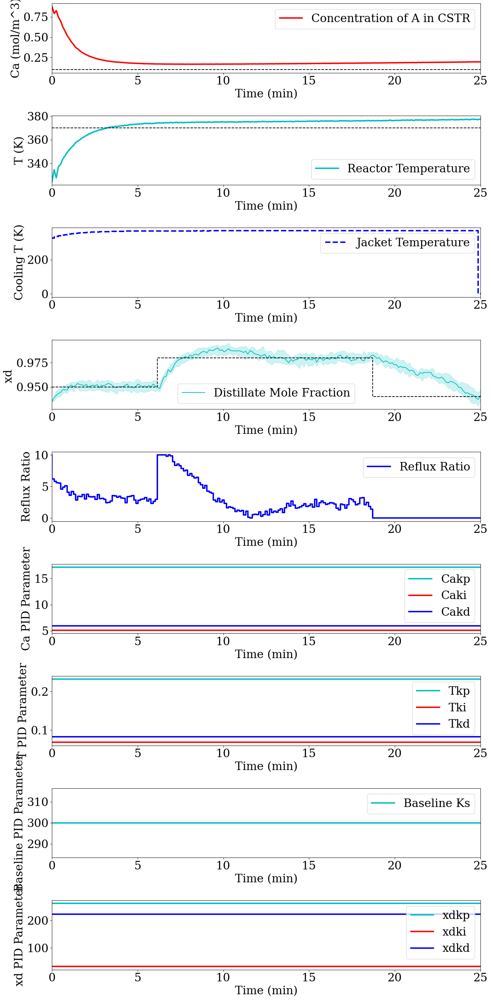

ISE:  0.035138284385367376


In [352]:
#Validation and plotting
reps = 10
ns = 200
k0     = 7.2e10 # Pre-exponential factor (1/sec)
UA     = 7e5    # U -Heat Transfer Coefficient (W/m^2-K) A -Area - (m^2)
Ca_relay_eval = np.zeros((ns, reps))
T_relay_eval = np.zeros((ns, reps))
Tc_relay_eval = np.zeros((ns, reps))
xd_relay_eval = np.zeros((ns, reps))
rr_relay_eval = np.zeros((ns, reps))


Ca_des_test = [0.1 for i in range(ns)]
T_des_test  = [370 for i in range(ns)]
xd_des_test = np.ones(ns)*0.95
xd_des_test[int(ns/4):] = 0.98
xd_des_test[int(3*ns/4):] = 0.94


SP_test = np.array([Ca_des_test,T_des_test,xd_des_test])

Ks_relay = np.array([ks_ca[0,i-1],ks_ca[1,i-1],ks_ca[2,i-1],ks_T[0,i-1],ks_T[1,i-1],ks_T[2,i-1],300,ks_dist[0,i-1],ks_dist[1,i-1],ks_dist[2,i-1],3])
ks_react_full = np.array([ks_ca[0,i-1],ks_ca[1,i-1],ks_ca[2,i-1],ks_T[0,i-1],ks_T[1,i-1],ks_T[2,i-1],300])
ks_relay_react = np.tile(ks_react_full,(reps,ns,7)).T
ks_relay_dist = np.tile(ks_dist[:,i-1],(reps,ns,3)).T

for r_i in range(reps):
    data = RSR_sim_relay(Ks_relay,ns,SP_test,200,True,'PID','PID','PID',k0,UA)

    Ca_relay_eval[:,r_i] = data['Ca']
    T_relay_eval[:,r_i] = data['T']
    xd_relay_eval[:,r_i] = data['xd']
    rr_relay_eval[:,r_i] = data['rr']
    Tc_relay_eval[:,r_i] = data['Tc']


SP_dist = np.array(([xd_des_test]))
SP_react = np.array([Ca_des_test,T_des_test])
# Plot sim results
plot_simulation_dist(Ca_relay_eval, T_relay_eval, xd_relay_eval,rr_relay_eval,SP_react,SP_dist,Tc_relay_eval,ks_relay_react,ks_relay_dist)
print('ISE: ', sum((np.median(xd_relay_eval,axis = 1)-xd_des_test)**2))

In [354]:
print(Ks_relay)

[1.71596354e+01 5.13322426e+00 5.97523018e+00 2.31620820e-01
 6.80061131e-02 8.21742984e-02 3.00000000e+02 2.61503261e+02
 3.19462972e+01 2.22978227e+02 3.00000000e+00]


# NMPC

In [454]:

# == Initial State == #
C_a_0 = 0.2
T_0 = 370
T_j_0 =  300
rr_0 = 3

# == Simulation Parameters and Data Structures == #
ns = 200
t_s = 1
reps = 10
x0_NMPC_CS3 = np.zeros((37,ns,reps))
u0_NMPC_CS3 = np.zeros((2,ns,reps))
y_next = np.zeros((37,ns,reps))




for r_i in range(reps):
  # == Model == #
  # Model type
  model_type = 'continuous'
  model = do_mpc.model.Model(model_type,'SX')

  #States
  for i in range(32): #Tray 0-31 mol fraction
    locals()['t_' + str(i)] = model.set_variable(var_type='_x', var_name='t_'+str(i), shape=(1,1))

  C_a = model.set_variable(var_type='_x', var_name='C_a', shape=(1,1)) # Concentration of A in the reactor
  T = model.set_variable(var_type='_x', var_name='T',shape=(1,1)) # Temperature inside the reactor
  R = model.set_variable(var_type = '_x',var_name = 'R',shape=(1,1))
  CaR = model.set_variable(var_type = '_x',var_name = 'CaR',shape=(1,1))
  CbR = model.set_variable(var_type = '_x',var_name = 'CbR',shape=(1,1))

  #Control inputs
  Tj = model.set_variable(var_type='_u', var_name='Tj',shape=(1,1)) # Temperature in the jacket
  rr = model.set_variable(var_type='_u',var_name = 'rr',shape = (1,1)) #Reflux ratio

  #TVP
  xd_SP = model.set_variable(var_type = '_tvp', var_name = 'xd_SP',shape=(1,1))
  Tf  = model.set_variable(var_type='_tvp',var_name = 'Tf',shape=(1,1))
  # == Reactor parameters == #

  Capf   = 1      # Process feed concentration of component A (mol/3)
  q      = 100    # Volumetric Flowrate (m^3/sec)
  V      = 100    # Volume of CSTR (m^3)
  rho    = 1000   # Density of A-B Mixture (kg/m^3)
  rho_M  = 0.01     # Molar density of A-B mix (mol/m3)
  Cp     = 0.239  # Heat capacity of A-B Mixture (J/kg-K)
  mdelH  = 5e4    # Heat of reaction for A->B (J/mol)
  EoverR = 8750   # E -Activation energy (J/mol), R -Constant = 8.31451 J/mol-K
  k0     = 7.2e10 # Pre-exponential factor (1/sec)
  UA     = 7e5    # U -Heat Transfer Coefficient (W/m^2-K) A -Area - (m^2)

  Tf     = 350

  qrf = R + q
  Caf = (R*CaR+q*Capf)/qrf
  rA     = k0*np.exp(-EoverR/T)*C_a # reaction rate



  Cb = (Caf*qrf-C_a*qrf)/qrf
  x_b = Cb*qrf/(Cb*qrf+C_a*qrf)
  x_feed = x_b
  qdf = qrf*rho_M
  # == Distillation Column Parameters == #
  # Vapor Mole Fractions of Component A
  # From the equilibrium assumption and mole balances
  # 1) vol = (yA/xA) / (yB/xB)
  # 2) xA + xB = 1
  # 3) yA + yB = 1

  D=0.5*qdf    # Distillate Flowrate (mol/s)
  B = qdf-D     # Bottoms flowrate (mol/s)
  L=rr*D        # Flowrate of the Liquid in the Rectification Section (mol/s)
  V=L+D         # Vapor Flowrate in the Column (mol/s)
  FL=qdf+L     # Flowrate of the Liquid in the Stripping Section (mol/s)
  vol=1.6         # Relative Volatility = (yA/xA)/(yB/xB) = KA/KB = alpha(A,B)
  atray=3       # Total Molar Holdup in the Condenser
  acond=1       # Total Molar Holdup on each Tray
  areb=0.5      # Total Molar Holdup in the Reboiler
  purge_ratio = 0.6 # Purge ratio

  # == Distillation Column equations == #



  model.set_rhs('t_0', 1/acond*V*(locals()['t_' + str(1)] * vol/(1.0+(vol-1.0)*locals()['t_' + str(1)])-t_0),process_noise = True)
  for i in range(1,16):
      model.set_rhs('t_'+str(i), 1.0/atray*(L*(locals()['t_' + str(i-1)]-locals()['t_' + str(i)])-V*(locals()['t_' + str(i)] * vol/(1.0+(vol-1.0)*locals()['t_' + str(i)])-locals()['t_' + str(i+1)] * vol/(1.0+(vol-1.0)*locals()['t_' + str(i+1)]))))
  model.set_rhs('t_16', 1/atray*(qdf*x_feed+L*t_15-FL*t_16-V*(locals()['t_' + str(16)] * vol/(1.0+(vol-1.0)*locals()['t_' + str(16)])-locals()['t_' + str(17)] * vol/(1.0+(vol-1.0)*locals()['t_' + str(17)]))))
  for i in range(17,31):
      model.set_rhs('t_'+str(i), 1.0/atray*(FL*(locals()['t_' + str(i-1)]-locals()['t_' + str(i)])-V*(locals()['t_' + str(i)] * vol/(1.0+(vol-1.0)*locals()['t_' + str(i)])-locals()['t_' + str(i+1)] * vol/(1.0+(vol-1.0)*locals()['t_' + str(i+1)]))))
  model.set_rhs('t_31', 1/areb*(FL*t_30-(qdf-D)*t_31-V*locals()['t_' + str(31)] * vol/(1.0+(vol-1.0)*locals()['t_' + str(31)])))
  model.set_rhs('C_a', q/V*(Caf - C_a) - rA,process_noise = True)
  model.set_rhs('T', q/V*(Tf - T) + mdelH/(rho*Cp)*rA  + UA/V/rho/Cp*(Tj-T),process_noise = True )

  model.set_rhs('R',(D-purge_ratio*D)*rho_M)
  model.set_rhs('CaR', (1-t_31)*B)
  model.set_rhs('CbR',t_31*B)


  model.setup()

  # == Controller == #
  mpc = do_mpc.controller.MPC(model)
  setup_mpc = {
      'n_horizon': 5,
      'n_robust': 0,
      'open_loop': 0,
      't_step': t_s,
      'state_discretization': 'collocation',
      'collocation_type': 'radau',
      'collocation_deg': 2,
      'collocation_ni': 2,
      'store_full_solution': True,

  }

  mpc.set_param(**setup_mpc)


  mpc.scaling['_x', 'T'] = 100
  mpc.scaling['_u', 'Tj'] = 100
  mpc.scaling['_u', 'rr'] = 10
  mpc.scaling['_x','R'] = 10
  mpc.scaling['_x','CaR'] = 10
  _x = model.x
  lterm =  ((_x['t_0']-model.tvp['xd_SP']))**2
  mterm = DM(0)
  mpc.set_rterm()

  mpc.set_objective(mterm=mterm, lterm=lterm)

  mpc.set_rterm() # input penalty
  tvp_template_mpc = mpc.get_tvp_template()

  Tf_arr = np.ones(ns+1000)*350
  Tf_arr[10:30] = 360
  def tvp_fun(t_now):
    t_now = t_now/t_s
    xd_des_test = [0.95 for i in range(int(ns/4))] + [0.98 for i in range(int(2*ns/4))] + [0.94 for i in range(int(ns/4)+100000)]
    #print(T_des_test[int(t_now+k)])
    for k in range(setup_mpc['n_horizon']):
      tvp_template_mpc['_tvp',k,'xd_SP'] = xd_des_test[int(t_now+k)]
      tvp_template_mpc['_tvp',k,'Tf'] = Tf_arr[int(t_now+k)]
    return tvp_template_mpc

  mpc.set_tvp_fun(tvp_fun)
  # lower bounds of the states
  for i in range(32):
    mpc.bounds['lower','_x','t_'+str(i)] = 0


  mpc.bounds['lower', '_x', 'C_a'] = 0
  mpc.bounds['lower', '_x', 'T'] = 0
  mpc.bounds['lower','_x','R'] = 0
  mpc.bounds['lower','_x','CaR'] = 0
  mpc.bounds['lower','_x','CbR'] = 0
  # upper bounds of the states
  for i in range(32):
      mpc.bounds['upper','_x','t_'+str(i)] = 1
  mpc.bounds['upper', '_x', 'C_a'] = 2
  mpc.bounds['upper', '_x', 'T'] = 800
  mpc.bounds['upper','_x','R'] = 20
  mpc.bounds['upper','_x','CbR'] = 20
  mpc.bounds['upper','_x','CaR'] = 100

  # lower bounds of the inputs
  mpc.bounds['lower', '_u', 'Tj'] = 200
  mpc.bounds['lower', '_u', 'rr'] = 0

  # upper bounds of the inputs
  mpc.bounds['upper', '_u', 'Tj'] = 400
  mpc.bounds['upper','_u','rr'] = 10
  mpc.setup()

  # == Estimator == #
  estimator = do_mpc.estimator.StateFeedback(model)

  # == Simulator == #
  simulator = do_mpc.simulator.Simulator(model)
  params_simulator = {
      'integration_tool': 'cvodes',
      'abstol': 1e-10,
      'reltol': 1e-10,
      't_step': t_s,

  }
  tvp_template = simulator.get_tvp_template()


  def tvp_fun(t_now):
    t_now = t_now/t_s
    xd_des_test = [0.95 for i in range(int(ns/4))] + [0.98 for i in range(int(2*ns/4))] + [0.934 for i in range(int(ns/4)+10000)]
    tvp_template['xd_SP'] = xd_des_test[int(t_now)]
    tvp_template['Tf'] = Tf_arr[int(t_now)]
    return tvp_template

  # Set the tvp_fun:
  simulator.set_tvp_fun(tvp_fun)
  simulator.set_param(**params_simulator)
  simulator.setup()

  # == Initial Conditions == #
  x0 = np.array([0.935,0.900,0.862,0.821,0.779,0.738,\
  0.698,0.661,0.628,0.599,0.574,0.553,0.535,0.521,    \
  0.510,0.501,0.494,0.485,0.474,0.459,0.441,0.419,    \
  0.392,0.360,0.324,0.284,0.243,0.201,0.161,0.125,    \
  0.092,0.064,C_a_0,T_0,0,0,0]).reshape(37,1)

  mpc.x0 = x0
  simulator.x0 = x0
  estimator.x0 = x0

  mpc.set_initial_guess()

  # == Closed-loop Simulation == #
  for k in range(ns-1):
    if k == 0:
      u0_NMPC_CS3[:,k,r_i] = mpc.make_step(x0).reshape(2)
      x0_NMPC_CS3[:,k,r_i] = x0.reshape(37)
    else:
      u0_NMPC_CS3[:,k,r_i] = mpc.make_step(x0_NMPC_CS3[:,k,r_i].reshape(-1,1)).reshape(2)
    Ca_noise = np.random.uniform(low=-0.001,high=0.001)
    T_noise = np.random.uniform(low=-.5,high=0.5)
    xd_noise = np.random.uniform(low=-0.005,high=0.005)
    w0 = np.array([xd_noise,Ca_noise,T_noise]).reshape(3,1)
    y_next[:,k,r_i] = simulator.make_step(u0_NMPC_CS3[:,k,r_i].reshape(2,1),w0 = w0).reshape(37)
    x0_NMPC_CS3[:,k+1,r_i] = estimator.make_step(y_next[:,k,r_i])


C:\Users\mfb22\AppData\Local\Temp\ipykernel_20280\4282956899.py:145: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  tvp_template_mpc['_tvp',k,'xd_SP'] = xd_des_test[int(t_now+k)]
C:\Users\mfb22\AppData\Local\Temp\ipykernel_20280\4282956899.py:146: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  tvp_template_mpc['_tvp',k,'Tf'] = Tf_arr[int(t_now+k)]


This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     6167
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:     2175

Total number of variables............................:     1564
                     variables with only lower bounds:        0
                variables with lower and upper bounds:     1046
                     variables with only upper bounds:        0
Total number of equality constraints.................:     1332
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.1250000e-03 4.49e+03 1.51e-05  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\mfb22\AppData\Local\Temp\ipykernel_20280\4282956899.py:196: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  tvp_template['xd_SP'] = xd_des_test[int(t_now)]
C:\Users\mfb22\AppData\Local\Temp\ipykernel_20280\4282956899.py:197: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  tvp_template['Tf'] = Tf_arr[int(t_now)]


   2  2.3704809e-04 3.04e-01 3.53e+01  -1.0 2.64e+00  -4.5 2.60e-01 1.60e-01f  2
   3  3.8878791e-04 1.76e-01 8.92e+01  -1.0 1.75e+00  -5.0 4.03e-01 2.09e-01f  2
   4  4.7110055e-04 6.73e-02 2.12e+02  -1.0 1.21e+00  -5.4 8.52e-01 1.36e-01f  3
   5  5.5054956e-04 1.02e-01 1.80e+02  -1.0 3.86e-01  -0.5 1.00e+00 2.48e-01f  3
   6  8.3142220e-04 4.77e+00 1.28e+00  -1.0 3.94e-01  -1.0 1.00e+00 1.00e+00F  1
   7  7.7877015e-04 1.34e+00 1.80e-01  -1.0 4.80e-02  -1.4 1.00e+00 1.00e+00h  1
   8  7.8229567e-04 2.04e-03 1.47e-02  -1.7 7.05e-03  -1.9 1.00e+00 1.00e+00h  1
   9  7.8227265e-04 5.91e-07 1.26e-04  -3.8 1.21e-04  -2.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  7.7903827e-04 1.15e-05 5.77e-02  -5.7 3.65e-03  -2.9 9.09e-01 1.00e+00h  1
  11  7.1830426e-04 1.14e-02 4.68e-02  -5.7 3.69e+00  -3.4 1.89e-01 4.51e-02h  1
  12  2.7176683e-04 1.91e-01 7.09e-02  -5.7 1.94e+00  -3.8 8.03e-02 4.36e-01h  1
  13  1.5902603e-04 8.89e-02

# Comparison

In [285]:
def plot_comparison_cs3(Ca_dat, T_dat, Tc_dat,xd_dat,rr_dat,SP,ns,ks_react, ks_dist,savefig):

    Ca_des = SP[0]
    T_des  = SP[1]
    xd_des = SP[2]
    t = np.linspace(0,26,199)
    t_NMPC = np.linspace(0,26,Ca_dat[3].shape[0])
    plt.figure(figsize=(30, 28))
    plt.rc('font',family = 'serif')
    plt.rcParams.update({'font.size':24})
    plt.rcParams.update({"mathtext.fontset":'cm'})
    
    ax1 = plt.subplot(911)
    plt.plot(t, np.median(Ca_dat[0][:-1],axis=1), 'r-', lw=2, label = 'RL-PID')
    plt.gca().fill_between(t, np.min(Ca_dat[0][:-1],axis=1), np.max(Ca_dat[0][:-1],axis=1),
                           color='r', alpha=0.2)
    plt.plot(t, np.median(Ca_dat[1][:-1],axis=1), 'b-', lw=2, label = 'DFO-PID')
    plt.gca().fill_between(t, np.min(Ca_dat[1][:-1],axis=1), np.max(Ca_dat[1][:-1],axis=1),
                           color='b', alpha=0.2)
    plt.plot(t, np.median(Ca_dat[2][:-1],axis=1), 'g-', lw=2,label = 'Relay-PID')
    plt.gca().fill_between(t, np.min(Ca_dat[2][:-1],axis=1), np.max(Ca_dat[2][:-1],axis=1),
                           color='g', alpha=0.2)
    plt.plot(t_NMPC[:-1], np.median(Ca_dat[3][:-1],axis=1), 'c-', lw=2,label = 'NMPC')
    plt.gca().fill_between(t_NMPC[:-1], np.min(Ca_dat[3][:-1],axis=1), np.max(Ca_dat[3][:-1],axis=1),
                           color='c', alpha=0.2)
    plt.step(t, Ca_des[:-1], '--', lw=1.5, color='black')
    plt.ylabel('$C_A$ [mol/m$^3$]')
    #plt.xlabel('Time [min]')
    plt.legend(loc='upper right', prop = {'size':17})
    plt.tick_params('x', labelbottom = False)
    plt.xlim(min(t), max(t))

    plt.subplot(912,sharex = ax1)
    plt.plot(t, np.median(T_dat[0][:-1],axis=1), 'r-', lw=2,label = 'RL-PID')
    plt.gca().fill_between(t, np.min(T_dat[0][:-1],axis=1), np.max(T_dat[0][:-1],axis=1),
                           color='r', alpha=0.2)

    plt.plot(t, np.median(T_dat[1][:-1],axis=1), 'b-', lw=2, label = 'DFO-PID')
    plt.gca().fill_between(t, np.min(T_dat[1][:-1],axis=1), np.max(T_dat[1][:-1],axis=1),
                           color='b', alpha=0.2)
    plt.plot(t, np.median(T_dat[2][:-1],axis=1), 'g-', lw=2,label = 'Relay-PID')
    plt.gca().fill_between(t, np.min(T_dat[2][:-1],axis=1), np.max(T_dat[2][:-1],axis=1),
                           color='g', alpha=0.2)
    plt.plot(t_NMPC[:-1], np.median(T_dat[3][:-1],axis=1), 'c-', lw=2,label = 'NMPC')
    plt.gca().fill_between(t_NMPC[:-1], np.min(T_dat[3][:-1],axis=1), np.max(T_dat[3][:-1],axis=1),
                           color='c', alpha=0.2)
    plt.step(t, T_des[:-1], '--', lw=1.5, color='black')
    plt.ylabel('$T$ [K]')
    #plt.xlabel('Time [min]')
    plt.tick_params('x', labelbottom = False)
    #plt.legend(loc='upper left')
    plt.xlim(min(t), max(t))

    plt.subplot(913,sharex = ax1)
    plt.step(t, np.median(Tc_dat[0][:-1],axis=1), 'r--', lw=2,label = 'RL-PID')
    plt.step(t, np.median(Tc_dat[1][:-1],axis=1), 'b--', lw=2, label = 'DFO-PID')
    plt.step(t, np.median(Tc_dat[2][:-1],axis=1), 'g--', lw=2,label = 'Relay-PID')
    plt.step(t_NMPC[:-1], np.median(Tc_dat[3][:-1],axis=1), 'c--', lw=2,label = 'NMPC')
    plt.ylabel('$T_J$ [K]')
    #plt.xlabel('Time [min]')
    plt.tick_params('x', labelbottom = False)
    #plt.legend(loc='upper left')
    plt.xlim(min(t), max(t))


    plt.subplot(914,sharex = ax1)
    plt.plot(t, np.median(xd_dat[0][:-1],axis=1), 'r-', lw=2,label = 'RL-PID')
    plt.gca().fill_between(t, np.min(xd_dat[0][:-1],axis=1), np.max(xd_dat[0][:-1],axis=1),
                           color='r', alpha=0.2)

    plt.plot(t, np.median(xd_dat[1][:-1],axis=1), 'b-', lw=2, label = 'DFO-PID')
    plt.gca().fill_between(t, np.min(xd_dat[1][:-1],axis=1), np.max(xd_dat[1][:-1],axis=1),
                           color='b', alpha=0.2)
    plt.plot(t, np.median(xd_dat[2][:-1],axis=1), 'g-', lw=2,label = 'Relay-PID')
    plt.gca().fill_between(t, np.min(xd_dat[2][:-1],axis=1), np.max(xd_dat[2][:-1],axis=1),
                           color='g', alpha=0.2)
    plt.plot(t_NMPC[:-1], np.median(xd_dat[3][:-1],axis=1), 'c-', lw=2,label = 'NMPC')
    plt.gca().fill_between(t_NMPC[:-1], np.min(xd_dat[3][:-1],axis=1), np.max(xd_dat[3][:-1],axis=1),
                           color='c', alpha=0.2)
    plt.step(t, xd_des[:-1], '--', lw=1.5, color='black')
    plt.ylabel('$x_{B,D}$')
    #plt.xlabel('Time [min]')
    #plt.legend(loc='upper left')
    plt.tick_params('x', labelbottom = False)
    plt.xlim(min(t), max(t))

    plt.subplot(915,sharex = ax1)
    plt.step(t, np.median(rr_dat[0][:-1],axis=1), 'r--', lw=2,label = 'RL-PID')
    plt.step(t, np.median(rr_dat[1][:-1],axis=1), 'b--', lw=2, label = 'DFO-PID')
    plt.step(t, np.median(rr_dat[2][:-1],axis=1), 'g--', lw=2,label = 'Relay-PID')
    plt.step(t_NMPC[:-1], np.median(rr_dat[3][:-1],axis=1), 'c--', lw=2,label = 'NMPC')
    plt.ylabel('R$_R$')
    #plt.xlabel('Time [min]')
    plt.tick_params('x', labelbottom = False)
    #plt.legend(loc='upper right')
    plt.xlim(min(t), max(t))
    
    labels = ['K$_p$','K$_i$','K$_d$','K$_p$','K$_I$','K$_d$']
    col = ['c-','m-','y-','c-','m-','y-']
    col_fill = ['c','m','y','c','m','y']
    plt.subplot(916,sharex = ax1)
    for ks_i in range(3):
      plt.plot(t, np.median(ks_react[ks_i,:,:][:-1],axis=1), col[ks_i], lw=3,label = labels[ks_i])
      plt.gca().fill_between(t, np.min(ks_react[ks_i,:,:][:-1],axis=1), np.max(ks_react[ks_i,:,:][:-1],axis=1),
                              color=col_fill[ks_i], alpha=0.2)
    plt.ylabel('C$_A$')
    #plt.xlabel('Time (min)')
    plt.legend(loc='upper right',prop = {'size':22})
    plt.title('PID Parameters')
    plt.tick_params('x', labelbottom = False)
    plt.xlim(min(t), max(t))

    plt.subplot(917,sharex = ax1)
    i = [3,4,5]
    for ks_i in i:
      plt.plot(t, np.median(ks_react[ks_i,:,:][:-1],axis=1), col[ks_i], lw=3,label = labels[ks_i])
      plt.gca().fill_between(t, np.min(ks_react[ks_i,:,:][:-1],axis=1), np.max(ks_react[ks_i,:,:][:-1],axis=1),
                              color=col_fill[ks_i], alpha=0.2)
    plt.ylabel('T')
    #plt.xlabel('Time (min)')
    #plt.legend(loc='best')
    plt.tick_params('x', labelbottom = False)
    plt.xlim(min(t), max(t))


    
    col_dist = ['c-','m-','y-']
    plt.subplot(918,sharex = ax1)
    for ks_i in range(3):
      plt.plot(t, np.median(ks_dist[ks_i,:,:][:-1],axis=1), col_dist[ks_i], lw=3,label = labels[ks_i])
      plt.gca().fill_between(t, np.min(ks_dist[ks_i,:,:][:-1],axis=1), np.max(ks_dist[ks_i,:,:][:-1],axis=1),
                              color=col_fill[ks_i], alpha=0.2)
    plt.ylabel(r'$x_{B,D}$')
    plt.xlabel('Time [min]')
    #plt.legend(loc='best')
    plt.xlim(min(t), max(t))



    plt.tight_layout()
    if savefig == True:
        plt.savefig('CS3.pdf')
    plt.show()

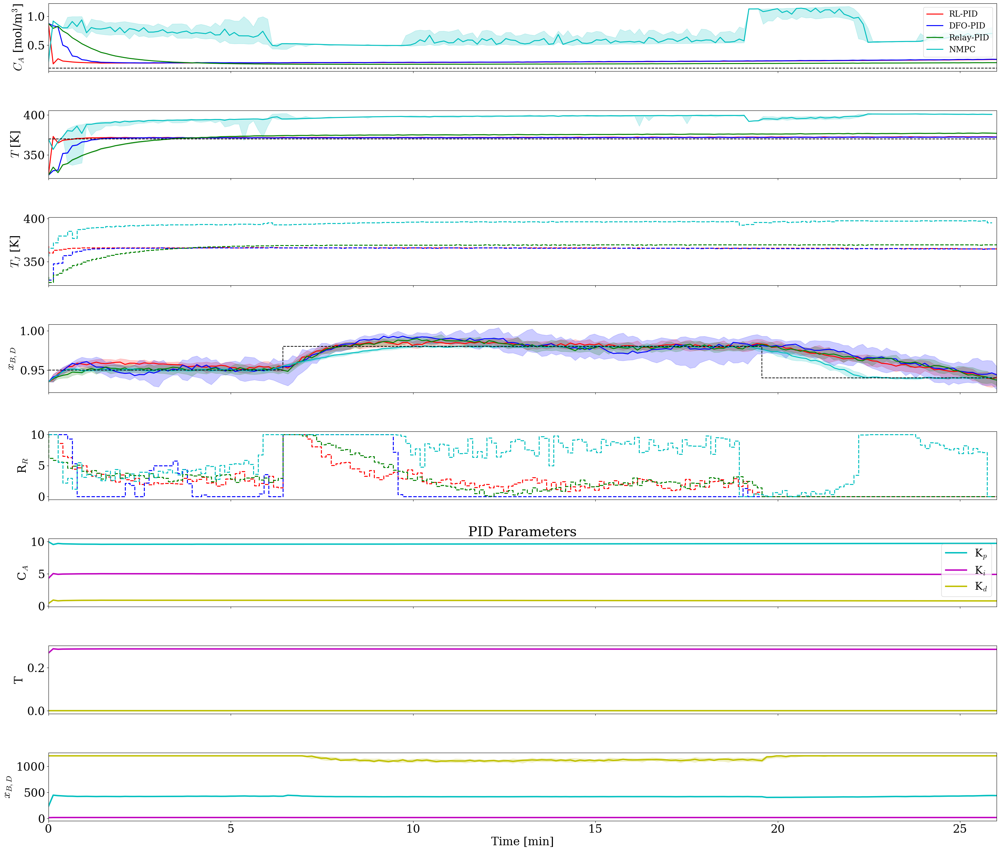

=== Ca-ISE ===
RL-PID : 3.1388
DFO-PID : 4.6391
Relay-PID : 5.0104
NMPC : 72.7876
=== T-ISE ===
RL-PID : 2866.5226
DFO-PID : 6558.6902
Relay-PID : 15595.3059
NMPC : 144495.9891
=== xd-ISE ===
RL-PID : 0.0325
DFO-PID : 0.0436
Relay-PID : 0.0351
NMPC : 0.0164


In [455]:
#Plot to compare RL, DFO and Relay
Ca_dat = np.array([Ca_eval,Ca_ks_evals,Ca_relay_eval,x0_NMPC_CS3[32,:,:]])
T_dat = np.array([T_eval,T_ks_evals,T_relay_eval,x0_NMPC_CS3[33,:,:]])
Tc_dat = np.array([Tc_eval,Tc_ks_evals,Tc_relay_eval,u0_NMPC_CS3[0,:,:]])
xd_dat = np.array([xd_eval,xd_ks_evals,xd_relay_eval,x0_NMPC_CS3[0,:,:]])
rr_dat = np.array([rr_eval,rr_ks_evals,rr_relay_eval,u0_NMPC_CS3[1,:,:]])
ns = 200

Ca_des_test = [0.1 for i in range(ns)]
T_des_test  = [370 for i in range(ns)]
xd_des_test = np.ones(ns)*0.95
xd_des_test[int(ns/4):] = 0.98
xd_des_test[int(3*ns/4):] = 0.94

SP = np.array([Ca_des_test,T_des_test,xd_des_test])

Ca_des_test_NMPC = [0.1 for i in range(200)]
T_des_test_NMPC  = [370 for i in range(200)]
xd_des_test_NMPC = np.ones(ns)*0.95
xd_des_test_NMPC[int(ns/4):] = 0.98
xd_des_test_NMPC[int(3*ns/4):] = 0.94

plot_comparison_cs3(Ca_dat, T_dat, Tc_dat,xd_dat,rr_dat,SP,ns,ks_react_RL,ks_dist_RL,True)

IAE_Ca = np.zeros(4)
IAE_T = np.zeros_like(IAE_Ca)
IAE_xd = np.zeros_like(IAE_Ca)
methods = ['RL-PID','DFO-PID','Relay-PID','NMPC']
for i in range(3):
  IAE_Ca[i] = sum((np.median(Ca_dat[i],axis=1)-Ca_des_test)**2)
  IAE_T[i] = sum((np.median(T_dat[i],axis=1)-T_des_test)**2)
  IAE_xd[i] = sum((np.median(xd_dat[i],axis=1)-xd_des_test)**2)

IAE_Ca[3]= sum((np.median(Ca_dat[3],axis=1)-Ca_des_test_NMPC)**2)#*(120/300)
IAE_T[3] = sum((np.median(T_dat[3],axis=1)-T_des_test_NMPC)**2)#*(120/300)
IAE_xd[3] = sum((np.median(xd_dat[3],axis=1)-xd_des_test_NMPC)**2)#*(120/300)
print('=== Ca-ISE ===')
for i in range(4):
   print(methods[i],':',round(IAE_Ca[i],4))
print('=== T-ISE ===')
for i in range(4):
  print(methods[i],':',round(IAE_T[i],4))
print('=== xd-ISE ===')
for i in range(4):
  print(methods[i],':',round(IAE_xd[i],4))

In [457]:
time_series_data = np.array((Ca_dat,T_dat,Tc_dat,rr_dat,xd_dat))
np.save('time_series_data_CS3.npy',time_series_data)

# Parametric Mismatch

In [373]:
def NMPC_CS3(UA_real,k0_real,reps):
  # == Initial State == #
  C_a_0 = 0.2
  T_0 = 370
  T_j_0 =  300
  rr_0 = 3
  
  # == Simulation Parameters and Data Structures == #
  ns = 200
  t_s = 1
  #reps = 1
  x0_NMPC_CS3 = np.zeros((37,ns,reps))
  u0_NMPC_CS3 = np.zeros((2,ns,reps))
  y_next = np.zeros((37,ns,reps))




  for r_i in range(reps):
    model_type = 'continuous'
    model_real = do_mpc.model.Model(model_type,'SX')

  #States
    for i in range(32): #Tray 0-31 mol fraction
        globals()['t_' + str(i)] = model_real.set_variable(var_type='_x', var_name='t_'+str(i), shape=(1,1))

    C_a = model_real.set_variable(var_type='_x', var_name='C_a', shape=(1,1)) # Concentration of A in the reactor
    T = model_real.set_variable(var_type='_x', var_name='T',shape=(1,1)) # Temperature inside the reactor
    R = model_real.set_variable(var_type = '_x',var_name = 'R',shape=(1,1))
    CaR = model_real.set_variable(var_type = '_x',var_name = 'CaR',shape=(1,1))
    CbR = model_real.set_variable(var_type = '_x',var_name = 'CbR',shape=(1,1))

  #Control inputs
    Tj = model_real.set_variable(var_type='_u', var_name='Tj',shape=(1,1)) # Temperature in the jacket
    rr = model_real.set_variable(var_type='_u',var_name = 'rr',shape = (1,1)) #Reflux ratio

  #TVP
    xd_SP = model_real.set_variable(var_type = '_tvp', var_name = 'xd_SP',shape=(1,1))
    Tf  = model_real.set_variable(var_type='_tvp',var_name = 'Tf',shape=(1,1))
  # == Reactor parameters == #

    Capf   = 1      # Process feed concentration of component A (mol/3)
    q      = 100    # Volumetric Flowrate (m^3/sec)
    V      = 100    # Volume of CSTR (m^3)
    rho    = 1000   # Density of A-B Mixture (kg/m^3)
    rho_M  = 0.01     # Molar density of A-B mix (mol/m3)
    Cp     = 0.239  # Heat capacity of A-B Mixture (J/kg-K)
    mdelH  = 5e4    # Heat of reaction for A->B (J/mol)
    EoverR = 8750   # E -Activation energy (J/mol), R -Constant = 8.31451 J/mol-1
    


    Tf     = 350

    qrf = R + q
    Caf = (R*CaR+q*Capf)/qrf
    rA     = k0_real*np.exp(-EoverR/T)*C_a # reaction rate



    Cb = (Caf*qrf-C_a*qrf)/qrf
    x_b = Cb*qrf/(Cb*qrf+C_a*qrf)
    x_feed = x_b
    qdf = qrf*rho_M
    # == Distillation Column Parameters == #
    # Vapor Mole Fractions of Component A
    # From the equilibrium assumption and mole balances
    # 1) vol = (yA/xA) / (yB/xB)
    # 2) xA + xB = 1
    # 3) yA + yB = 1

    D=0.5*qdf    # Distillate Flowrate (mol/s)
    B = qdf-D     # Bottoms flowrate (mol/s)
    L=rr*D        # Flowrate of the Liquid in the Rectification Section (mol/s)
    V=L+D         # Vapor Flowrate in the Column (mol/s)
    FL=qdf+L     # Flowrate of the Liquid in the Stripping Section (mol/s)
    vol=1.6         # Relative Volatility = (yA/xA)/(yB/xB) = KA/KB = alpha(A,B)
    atray=3       # Total Molar Holdup in the Condenser
    acond=1       # Total Molar Holdup on each Tray
    areb=0.5      # Total Molar Holdup in the Reboiler
    purge_ratio = 0.6 # Purge ratio

  # == Distillation Column equations == #
    model_real.set_rhs('t_0', 1/acond*V*(globals()['t_' + str(1)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(1)])-t_0),process_noise = True)
    for i in range(1,16):
        model_real.set_rhs('t_'+str(i), 1.0/atray*(L*(globals()['t_' + str(i-1)]-globals()['t_' + str(i)])-V*(globals()['t_' + str(i)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(i)])-globals()['t_' + str(i+1)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(i+1)]))))
    model_real.set_rhs('t_16', 1/atray*(qdf*x_feed+L*t_15-FL*t_16-V*(globals()['t_' + str(16)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(16)])-globals()['t_' + str(17)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(17)]))))
    for i in range(17,31):
        model_real.set_rhs('t_'+str(i), 1.0/atray*(FL*(globals()['t_' + str(i-1)]-globals()['t_' + str(i)])-V*(globals()['t_' + str(i)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(i)])-globals()['t_' + str(i+1)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(i+1)]))))
    model_real.set_rhs('t_31', 1/areb*(FL*t_30-(qdf-D)*t_31-V*globals()['t_' + str(31)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(31)])))
    model_real.set_rhs('C_a', q/V*(Caf - C_a) - rA,process_noise = True)
    model_real.set_rhs('T', q/V*(Tf - T) + mdelH/(rho*Cp)*rA  + UA_real/V/rho/Cp*(Tj-T),process_noise = True )

    model_real.set_rhs('R',(D-purge_ratio*D)*rho_M)
    model_real.set_rhs('CaR', (1-t_31)*B)
    model_real.set_rhs('CbR',t_31*B)
  
    model_real.setup()
    
    # == Model == #
    # Model type
    model_type = 'continuous'
    model = do_mpc.model.Model(model_type,'SX')

  #States
    for i in range(32): #Tray 0-31 mol fraction
        globals()['t_' + str(i)] = model.set_variable(var_type='_x', var_name='t_'+str(i), shape=(1,1))

    C_a = model.set_variable(var_type='_x', var_name='C_a', shape=(1,1)) # Concentration of A in the reactor
    T = model.set_variable(var_type='_x', var_name='T',shape=(1,1)) # Temperature inside the reactor
    R = model.set_variable(var_type = '_x',var_name = 'R',shape=(1,1))
    CaR = model.set_variable(var_type = '_x',var_name = 'CaR',shape=(1,1))
    CbR = model.set_variable(var_type = '_x',var_name = 'CbR',shape=(1,1))

  #Control inputs
    Tj = model.set_variable(var_type='_u', var_name='Tj',shape=(1,1)) # Temperature in the jacket
    rr = model.set_variable(var_type='_u',var_name = 'rr',shape = (1,1)) #Reflux ratio

  #TVP
    xd_SP = model.set_variable(var_type = '_tvp', var_name = 'xd_SP',shape=(1,1))
    Tf  = model.set_variable(var_type='_tvp',var_name = 'Tf',shape=(1,1))
  # == Reactor parameters == #

    Capf   = 1      # Process feed concentration of component A (mol/3)
    q      = 100    # Volumetric Flowrate (m^3/sec)
    V      = 100    # Volume of CSTR (m^3)
    rho    = 1000   # Density of A-B Mixture (kg/m^3)
    rho_M  = 0.01     # Molar density of A-B mix (mol/m3)
    Cp     = 0.239  # Heat capacity of A-B Mixture (J/kg-K)
    mdelH  = 5e4    # Heat of reaction for A->B (J/mol)
    EoverR = 8750   # E -Activation energy (J/mol), R -Constant = 8.31451 J/mol-1
    k0     = 7.2e10 # Pre-exponential factor (1/sec)
    UA     = 7e5    # U -Heat Transfer Coefficient (W/m^2-K) A -Area - (m^2)


    Tf     = 350

    qrf = R + q
    Caf = (R*CaR+q*Capf)/qrf
    rA     = k0*np.exp(-EoverR/T)*C_a # reaction rate



    Cb = (Caf*qrf-C_a*qrf)/qrf
    x_b = Cb*qrf/(Cb*qrf+C_a*qrf)
    x_feed = x_b
    qdf = qrf*rho_M
    # == Distillation Column Parameters == #
    # Vapor Mole Fractions of Component A
    # From the equilibrium assumption and mole balances
    # 1) vol = (yA/xA) / (yB/xB)
    # 2) xA + xB = 1
    # 3) yA + yB = 1

    D=0.5*qdf    # Distillate Flowrate (mol/s)
    B = qdf-D     # Bottoms flowrate (mol/s)
    L=rr*D        # Flowrate of the Liquid in the Rectification Section (mol/s)
    V=L+D         # Vapor Flowrate in the Column (mol/s)
    FL=qdf+L     # Flowrate of the Liquid in the Stripping Section (mol/s)
    vol=1.6         # Relative Volatility = (yA/xA)/(yB/xB) = KA/KB = alpha(A,B)
    atray=3       # Total Molar Holdup in the Condenser
    acond=1       # Total Molar Holdup on each Tray
    areb=0.5      # Total Molar Holdup in the Reboiler
    purge_ratio = 0.6 # Purge ratio

  # == Distillation Column equations == #
    model.set_rhs('t_0', 1/acond*V*(globals()['t_' + str(1)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(1)])-t_0),process_noise = True)
    for i in range(1,16):
        model.set_rhs('t_'+str(i), 1.0/atray*(L*(globals()['t_' + str(i-1)]-globals()['t_' + str(i)])-V*(globals()['t_' + str(i)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(i)])-globals()['t_' + str(i+1)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(i+1)]))))
    model.set_rhs('t_16', 1/atray*(qdf*x_feed+L*t_15-FL*t_16-V*(globals()['t_' + str(16)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(16)])-globals()['t_' + str(17)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(17)]))))
    for i in range(17,31):
        model.set_rhs('t_'+str(i), 1.0/atray*(FL*(globals()['t_' + str(i-1)]-globals()['t_' + str(i)])-V*(globals()['t_' + str(i)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(i)])-globals()['t_' + str(i+1)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(i+1)]))))
    model.set_rhs('t_31', 1/areb*(FL*t_30-(qdf-D)*t_31-V*globals()['t_' + str(31)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(31)])))
    model.set_rhs('C_a', q/V*(Caf - C_a) - rA,process_noise = True)
    model.set_rhs('T', q/V*(Tf - T) + mdelH/(rho*Cp)*rA  + UA/V/rho/Cp*(Tj-T),process_noise = True )

    model.set_rhs('R',(D-purge_ratio*D)*rho_M)
    model.set_rhs('CaR', (1-t_31)*B)
    model.set_rhs('CbR',t_31*B)
  
    model.setup()

  # == Controller == #
    mpc = do_mpc.controller.MPC(model)
    setup_mpc = {
      'n_horizon': 5,
      'n_robust': 1,
      'open_loop': 0,
      't_step': t_s,
      'state_discretization': 'collocation',
      'collocation_type': 'radau',
      'collocation_deg': 2,
      'collocation_ni': 2,
      'store_full_solution': True,

  }

    mpc.set_param(**setup_mpc)


    mpc.scaling['_x', 'T'] = 100
    mpc.scaling['_u', 'Tj'] = 100
    mpc.scaling['_u', 'rr'] = 10
    mpc.scaling['_x','R'] = 10
    mpc.scaling['_x','CaR'] = 10
    _x = model.x
    lterm =  ((_x['t_0']-model.tvp['xd_SP']))**2
    mterm = DM(0)
    mpc.set_rterm()

    mpc.set_objective(mterm=mterm, lterm=lterm)

    mpc.set_rterm() # input penalty
    tvp_template_mpc = mpc.get_tvp_template()

    Tf_arr = np.ones(ns+1000)*350
    Tf_arr[10:30] = 360
    def tvp_fun(t_now):
      t_now = t_now/t_s
      xd_des_test = [0.95 for i in range(int(ns/4))] + [0.98 for i in range(int(2*ns/4))] + [0.94 for i in range(int(ns/4)+100000)]
    #print(T_des_test[int(t_now+k)])
      for k in range(setup_mpc['n_horizon']):
        tvp_template_mpc['_tvp',k,'xd_SP'] = xd_des_test[int(t_now+k)]
        tvp_template_mpc['_tvp',k,'Tf'] = Tf_arr[int(t_now+k)]
      return tvp_template_mpc

    mpc.set_tvp_fun(tvp_fun)
  # lower bounds of the states
    for i in range(32):
      mpc.bounds['lower','_x','t_'+str(i)] = 0


    mpc.bounds['lower', '_x', 'C_a'] = 0
    mpc.bounds['lower', '_x', 'T'] = 0
    mpc.bounds['lower','_x','R'] = 0
    mpc.bounds['lower','_x','CaR'] = 0
    mpc.bounds['lower','_x','CbR'] = 0
  # upper bounds of the states
    for i in range(32):
        mpc.bounds['upper','_x','t_'+str(i)] = 1
    mpc.bounds['upper', '_x', 'C_a'] = 2
    mpc.bounds['upper', '_x', 'T'] = 800
    mpc.bounds['upper','_x','R'] = 20
    mpc.bounds['upper','_x','CbR'] = 20
    mpc.bounds['upper','_x','CaR'] = 100

  # lower bounds of the inputs
    mpc.bounds['lower', '_u', 'Tj'] = 200
    mpc.bounds['lower', '_u', 'rr'] = 0

  # upper bounds of the inputs
    mpc.bounds['upper', '_u', 'Tj'] = 400
    mpc.bounds['upper','_u','rr'] = 10
    mpc.setup()

    # == Estimator == #
    estimator = do_mpc.estimator.StateFeedback(model_real)

  # == Simulator == #
    simulator = do_mpc.simulator.Simulator(model_real)
    params_simulator = {
      'integration_tool': 'cvodes',
      'abstol': 1e-10,
      'reltol': 1e-10,
      't_step': t_s,

  }
    tvp_template = simulator.get_tvp_template()


    def tvp_fun(t_now):
      t_now = t_now/t_s
      xd_des_test = [0.95 for i in range(int(ns/4))] + [0.98 for i in range(int(2*ns/4))] + [0.94 for i in range(int(ns/4)+10000)]
      tvp_template['xd_SP'] = xd_des_test[int(t_now)]
      tvp_template['Tf'] = Tf_arr[int(t_now)]
      return tvp_template

  # Set the tvp_fun:
    simulator.set_tvp_fun(tvp_fun)
    simulator.set_param(**params_simulator)
    simulator.setup()

  # == Initial Conditions == #
    x0 = np.array([0.935,0.900,0.862,0.821,0.779,0.738,\
    0.698,0.661,0.628,0.599,0.574,0.553,0.535,0.521,    \
    0.510,0.501,0.494,0.485,0.474,0.459,0.441,0.419,    \
    0.392,0.360,0.324,0.284,0.243,0.201,0.161,0.125,    \
    0.092,0.064,C_a_0,T_0,0,0,0]).reshape(37,1)

    mpc.x0 = x0
    simulator.x0 = x0
    estimator.x0 = x0
 
    mpc.set_initial_guess()

  # == Closed-loop Simulation == #
    for k in range(ns-1):
      if k == 0:
        u0_NMPC_CS3[:,k,r_i] = mpc.make_step(x0).reshape(2)
        x0_NMPC_CS3[:,k,r_i] = x0.reshape(37)
      else:
        u0_NMPC_CS3[:,k,r_i] = mpc.make_step(x0_NMPC_CS3[:,k,r_i].reshape(-1,1)).reshape(2)
      Ca_noise = np.random.uniform(low=-0.001,high=0.001)
      T_noise = np.random.uniform(low=-.5,high=0.5)
      xd_noise = np.random.uniform(low=-0.005,high=0.005)
      w0 = np.array([xd_noise,Ca_noise,T_noise]).reshape(3,1)
      y_next[:,k,r_i] = simulator.make_step(u0_NMPC_CS3[:,k,r_i].reshape(2,1),w0 = w0).reshape(37)
      x0_NMPC_CS3[:,k+1,r_i] = estimator.make_step(y_next[:,k,r_i])
     
  return x0_NMPC_CS3,u0_NMPC_CS3


In [393]:
%%capture
k0 = 7.2e10
UA = np.linspace(0.1e5,7e5,20)
ns = 200
reps = 3
IAE_Ca_UA = np.zeros((UA.shape[0],4,reps))
IAE_T_UA = np.zeros_like(IAE_Ca_UA)
IAE_xd_UA = np.zeros_like(IAE_Ca_UA)

Ca_des_test = [0.1 for i in range(ns)]
T_des_test  = [370 for i in range(ns)]
xd_des_test = np.ones(ns)*0.95
xd_des_test[int(ns/4):] = 0.98
xd_des_test[int(3*ns/4):] = 0.94

SP = np.array([Ca_des_test,T_des_test,xd_des_test])
for r_i in range(reps):
  for i in range(UA.shape[0]):
      data_RL_UA = RSR_sim(0,best_policy,ns,SP,200,True,False,True,k0,UA[i]) #Disturbance active
      data_Ks_relay_UA = RSR_sim(Ks_relay,1,ns,SP,200,True,True,True,k0,UA[i])
      data_KsOpt_UA = RSR_sim(Ks_opt,1,ns,SP,200,True,True,True,k0,UA[i])

      Ca_eval_UA = data_RL_UA['Ca']
      T_eval_UA = data_RL_UA['T']
      Tc_eval_UA = data_RL_UA['Tc']
      xd_eval_UA = data_RL_UA['xd']

      Ca_relay_eval_UA = data_Ks_relay_UA['Ca']
      T_relay_eval_UA = data_Ks_relay_UA['T']
      Tc_relay_eval_UA = data_Ks_relay_UA['Tc']
      xd_relay_eval_UA = data_Ks_relay_UA['xd']

      Ca_ks_eval_UA = data_KsOpt_UA['Ca']
      T_ks_eval_UA = data_KsOpt_UA['T']
      Tc_ks_eval_UA = data_KsOpt_UA['Tc']
      xd_ks_eval_UA = data_KsOpt_UA['xd']
      x0_NMPC_CS3_UA,u0_NMPC_CS3_UA = NMPC_CS3(UA[i],k0,1)
      print('UA:',UA)

      methods = ['RL-PID','DFO-PID','Relay-PID','NMPC']
      Ca_dat_UA = np.array([data_RL_UA['Ca'],data_KsOpt_UA['Ca'],data_Ks_relay_UA['Ca'],x0_NMPC_CS3_UA[32,:,0]])
      T_dat_UA = np.array([data_RL_UA['T'],data_KsOpt_UA['T'],data_Ks_relay_UA['T'],x0_NMPC_CS3_UA[33,:,0]])
      xd_dat_UA = np.array([data_RL_UA['xd'],data_KsOpt_UA['xd'],data_Ks_relay_UA['xd'],x0_NMPC_CS3_UA[0,:,0]])
      
      for i_ISE in range(4):
        IAE_Ca_UA[i,i_ISE,r_i] = sum((Ca_dat_UA[i_ISE]-Ca_des_test)**2)
        IAE_T_UA[i,i_ISE,r_i] = sum((T_dat_UA[i_ISE]-T_des_test)**2)
        IAE_xd_UA[i,i_ISE,r_i] = sum((xd_dat_UA[i_ISE]-xd_des_test)**2)

In [399]:
%%capture
k0 = 7.2e10
UA = np.linspace(1e3,0.1e5,20)
ns = 200
reps = 3
IAE_Ca_UA_2 = np.zeros((UA.shape[0],4,reps))
IAE_T_UA_2 = np.zeros_like(IAE_Ca_UA_2)
IAE_xd_UA_2 = np.zeros_like(IAE_Ca_UA_2)

Ca_des_test = [0.1 for i in range(ns)]
T_des_test  = [370 for i in range(ns)]
xd_des_test = np.ones(ns)*0.95
xd_des_test[int(ns/4):] = 0.98
xd_des_test[int(3*ns/4):] = 0.94

SP = np.array([Ca_des_test,T_des_test,xd_des_test])
for r_i in range(reps):
  for i in range(UA.shape[0]):
      data_RL_UA_2 = RSR_sim(0,best_policy,ns,SP,200,True,False,True,k0,UA[i]) #Disturbance active
      data_Ks_relay_UA_2 = RSR_sim(Ks_relay,1,ns,SP,200,True,True,True,k0,UA[i])
      data_KsOpt_UA_2 = RSR_sim(Ks_opt,1,ns,SP,200,True,True,True,k0,UA[i])

      Ca_eval_UA_2 = data_RL_UA_2['Ca']
      T_eval_UA_2 = data_RL_UA_2['T']
      Tc_eval_UA_2 = data_RL_UA_2['Tc']
      xd_eval_UA_2 = data_RL_UA_2['xd']

      Ca_relay_eval_UA_2 = data_Ks_relay_UA_2['Ca']
      T_relay_eval_UA_2 = data_Ks_relay_UA_2['T']
      Tc_relay_eval_UA_2 = data_Ks_relay_UA_2['Tc']
      xd_relay_eval_UA_2 = data_Ks_relay_UA_2['xd']

      Ca_ks_eval_UA_2 = data_KsOpt_UA_2['Ca']
      T_ks_eval_UA_2 = data_KsOpt_UA_2['T']
      Tc_ks_eval_UA_2 = data_KsOpt_UA_2['Tc']
      xd_ks_eval_UA_2 = data_KsOpt_UA_2['xd']
      x0_NMPC_CS3_UA_2,u0_NMPC_CS3_UA_2 = NMPC_CS3(UA[i],k0,1)
      print('UA:',UA)

      methods = ['RL-PID','DFO-PID','Relay-PID','NMPC']
      Ca_dat_UA_2 = np.array([data_RL_UA_2['Ca'],data_KsOpt_UA_2['Ca'],data_Ks_relay_UA_2['Ca'],x0_NMPC_CS3_UA_2[32,:,0]])
      T_dat_UA_2 = np.array([data_RL_UA_2['T'],data_KsOpt_UA_2['T'],data_Ks_relay_UA_2['T'],x0_NMPC_CS3_UA_2[33,:,0]])
      xd_dat_UA_2 = np.array([data_RL_UA_2['xd'],data_KsOpt_UA_2['xd'],data_Ks_relay_UA_2['xd'],x0_NMPC_CS3_UA_2[0,:,0]])
      
      for i_ISE in range(4):
        IAE_Ca_UA_2[i,i_ISE,r_i] = sum((Ca_dat_UA_2[i_ISE]-Ca_des_test)**2)
        IAE_T_UA_2[i,i_ISE,r_i] = sum((T_dat_UA_2[i_ISE]-T_des_test)**2)
        IAE_xd_UA_2[i,i_ISE,r_i] = sum((xd_dat_UA_2[i_ISE]-xd_des_test)**2)

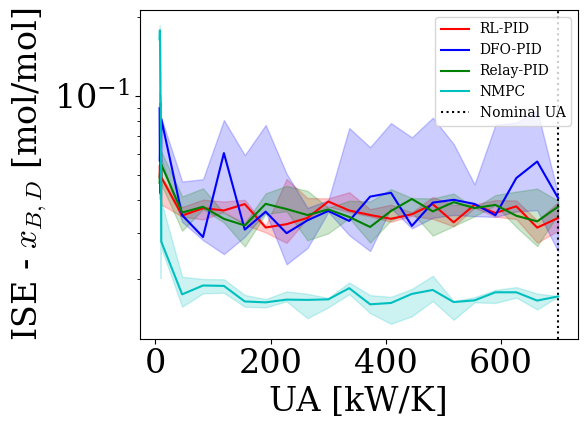

In [453]:
UA_comp = np.hstack((UA2[13:19],UA1))
IAE_xd_UA_comp = np.vstack((IAE_xd_UA_2[13:19,:,:],IAE_xd_UA))

col = ['r','b','g','c']
plt.figure()
for i in range(4):
    plt.plot(UA_comp/1e3,np.median(IAE_xd_UA_comp[:,i,:],axis = 1),color = col[i],label = methods[i])
    plt.gca().fill_between(UA_comp/1e3, np.min(IAE_xd_UA_comp[:,i,:],axis=1), np.max(IAE_xd_UA_comp[:,i,:],axis=1),color = col[i],alpha=0.2)
plt.axvline(x = 7e2, color = 'black',linestyle = 'dotted', label = 'Nominal UA')
plt.ylabel('ISE - $x_{B,D}$ [mol/mol]')
plt.yscale('log')
plt.xlabel('UA [kW/K]')
plt.legend(loc = 'upper right',prop={'size':10})
plt.tight_layout()
plt.savefig('CS3_ParaMis_UA.pdf')
plt.show()

In [458]:
np.save('param_mis_UA_CS3.npy',IAE_xd_UA_comp)

In [397]:
%%capture
k0 = np.linspace(0.1e10,7.2e10,20)
UA = 7e5
ns = 200
reps = 3
IAE_Ca_k0 = np.zeros((k0.shape[0],4,reps))
IAE_T_k0 = np.zeros_like(IAE_Ca_k0)
IAE_xd_k0 = np.zeros_like(IAE_Ca_k0)

Ca_des_test = [0.1 for i in range(ns)]
T_des_test  = [370 for i in range(ns)]
xd_des_test = np.ones(ns)*0.95
xd_des_test[int(ns/4):] = 0.98
xd_des_test[int(3*ns/4):] = 0.94

SP = np.array([Ca_des_test,T_des_test,xd_des_test])
for r_i in range(reps):
  for i in range(k0.shape[0]):
      data_RL_k0 = RSR_sim(0,best_policy,ns,SP,200,True,False,True,k0[i],UA) #Disturbance active
      data_Ks_relay_k0 = RSR_sim(Ks_relay,1,ns,SP,200,True,True,True,k0[i],UA)
      data_KsOpt_k0 = RSR_sim(Ks_opt,1,ns,SP,200,True,True,True,k0[i],UA)

      Ca_eval_k0 = data_RL_k0['Ca']
      T_eval_k0 = data_RL_k0['T']
      Tc_eval_k0 = data_RL_k0['Tc']
      xd_eval_k0 = data_RL_k0['xd']

      Ca_relay_eval_k0 = data_Ks_relay_k0['Ca']
      T_relay_eval_k0 = data_Ks_relay_k0['T']
      Tc_relay_eval_k0 = data_Ks_relay_k0['Tc']
      xd_relay_eval_k0 = data_Ks_relay_k0['xd']

      Ca_ks_eval_k0 = data_KsOpt_k0['Ca']
      T_ks_eval_k0 = data_KsOpt_k0['T']
      Tc_ks_eval_k0 = data_KsOpt_k0['Tc']
      xd_ks_eval_k0 = data_KsOpt_k0['xd']
      x0_NMPC_CS3_k0,u0_NMPC_CS3_k0= NMPC_CS3(UA,k0[i],1)
      print('UA:',UA)

      methods = ['RL-PID','DFO-PID','Relay-PID','NMPC']
      Ca_dat_k0 = np.array([data_RL_k0['Ca'],data_KsOpt_k0['Ca'],data_Ks_relay_k0['Ca'],x0_NMPC_CS3_k0[32,:,0]])
      T_dat_k0 = np.array([data_RL_k0['T'],data_KsOpt_k0['T'],data_Ks_relay_k0['T'],x0_NMPC_CS3_k0[33,:,0]])
      xd_dat_k0 = np.array([data_RL_k0['xd'],data_KsOpt_k0['xd'],data_Ks_relay_k0['xd'],x0_NMPC_CS3_k0[0,:,0]])
      
      for i_ISE in range(4):
        IAE_Ca_k0[i,i_ISE,r_i] = sum((Ca_dat_k0[i_ISE]-Ca_des_test)**2)
        IAE_T_k0[i,i_ISE,r_i] = sum((T_dat_k0[i_ISE]-T_des_test)**2)
        IAE_xd_k0[i,i_ISE,r_i] = sum((xd_dat_k0[i_ISE]-xd_des_test)**2)

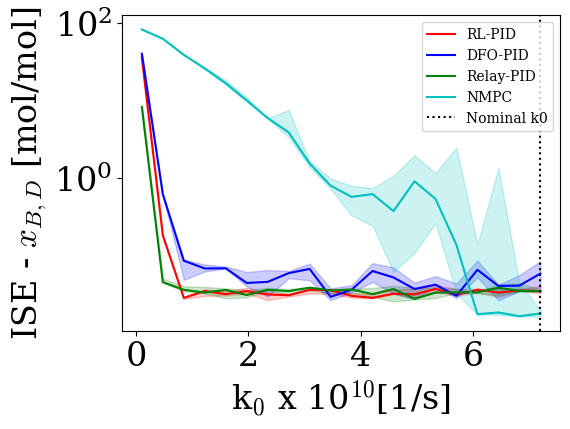

In [451]:
# plt.figure()
# plt.plot(k0,IAE_Ca_k0,label = methods)
# plt.axvline(x = 7.2e10, color = 'b', label = 'Nominal k0')
# plt.xlabel('k0')
# plt.ylabel('ISE - $C_A$')
# plt.legend()
# plt.show()

# plt.figure()
# plt.axvline(x = 7.2e10, color = 'b', label = 'Nominal k0')
# plt.plot(k0,IAE_T_k0,label = methods)
# plt.ylabel('ISE - $T$')
# plt.xlabel('k0')
# plt.legend()
# plt.show()
small_methods = ['RL-PID','DFO-PID','Relay-PID']
k0 = np.linspace(0.1e10,7.2e10,20)
# plt.figure()
# plt.axvline(x = 7.2e10, color = 'b', label = 'Nominal k0')
# plt.plot(k0,IAE_xd_k0,label = methods)
# plt.ylabel('ISE - $x_d$')
# plt.xlabel('k0')
# plt.legend(prop={'size':10})
# plt.show()




k0 = np.linspace(0.1e10,7.2e10,20)
col = ['r','b','g','c']
plt.figure()

for i in range(4):
    plt.plot(k0/1e10,np.median(IAE_xd_k0[:,i,:],axis = 1),color = col[i],label = methods[i])
    plt.gca().fill_between(k0/1e10, np.min(IAE_xd_k0[:,i,:],axis=1), np.max(IAE_xd_k0[:,i,:],axis=1),color = col[i],alpha=0.2)
plt.axvline(x = 7.2, color = 'black',linestyle = 'dotted', label = 'Nominal k0')
plt.ylabel('ISE - $x_{B,D}$ [mol/mol]')
plt.yscale('log')
plt.xlabel('k$_0$ x 10$^{10}$[1/s]')
plt.legend(loc = 'upper right', prop={'size':10})
plt.tight_layout()
plt.savefig('CS3_ParaMis_k0.pdf')
plt.show()

In [459]:
np.save('param_mis_k0_CS3.npy',IAE_xd_k0)